# IMPORTS

In [49]:
'''
!pip uninstall scikit-learn --yes
!pip install scikit-learn==1.2.2
!pip install imblearn
!pip install imbalanced-learn
!pip install lightgbm
!pip install xgboost
!pip install catboost
!pip install category_encoders
!pip install optuna
!pip install ydata-profiling
'''

#imblearn pipeline works without error with scikit-learn 1.2.2

'\n!pip uninstall scikit-learn --yes\n!pip install scikit-learn==1.2.2\n!pip install imblearn\n!pip install imbalanced-learn\n!pip install lightgbm\n!pip install xgboost\n!pip install catboost\n!pip install category_encoders\n!pip install optuna\n!pip install ydata-profiling\n'

In [50]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')

#For all combinations of list
from itertools import combinations

#For runtime calculation
from time import time

# Missing values visualization and  imputer
import missingno as msno
from sklearn.impute import KNNImputer, SimpleImputer

#To predict Gender from Name
from genderize import Genderize

#Multivariate Outlier Detection Algorithms
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

# Scaling
from sklearn.preprocessing import (
    MaxAbsScaler,
    MinMaxScaler,
    Normalizer,
    PowerTransformer,
    QuantileTransformer,
    RobustScaler,
    StandardScaler
)

# Categorical to Numerical transformation
from category_encoders import  (OneHotEncoder,
                                OrdinalEncoder,
                                BinaryEncoder,
                                CountEncoder,
                                TargetEncoder,
                                WOEEncoder,
                                CatBoostEncoder)


# Model Evaluation Metrics
from sklearn.metrics import (roc_auc_score,
                             classification_report,
                             accuracy_score,
                             precision_score,
                             recall_score,
                             f1_score)

#Visualizations of metrics 
from sklearn.metrics import (RocCurveDisplay,
                             ConfusionMatrixDisplay,
                             PrecisionRecallDisplay)

#Feature Selection
from sklearn.feature_selection import RFE,mutual_info_classif,SelectKBest,SelectPercentile,SelectFromModel

#Dimensionality Reduction
from sklearn.decomposition import PCA, KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import Isomap,MDS, LocallyLinearEmbedding, SpectralEmbedding, TSNE

#Model Selection and CV
from sklearn.model_selection import train_test_split,cross_val_score,KFold
from sklearn.linear_model  import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier,VotingClassifier
from sklearn.svm import SVC
from sklearn import neighbors
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import GaussianNB

# Optuna
import optuna

#Pipeline Creation
#from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline
from imblearn import FunctionSampler
from sklearn.compose import ColumnTransformer

# To save models
import joblib

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
from typing import Optional

# CUSTOM FUNCTIONS

## For Basic EDA

In [51]:
def checkNumCat(data,printVars=False,printClasses=False,needReturn=True):
    '''
    Print numerical, categorical, continuous and discrete variables and total classes of categories
    
    data => DataFrame
    
    printVars => Default True; True or False, to print numerical, categorical, continuous and discrete variables set True otherwise set False
    
    printClasses => Default True; True or False, to print number of classes of categorical variables set True otherwise set False
    
    needReturn => Default True; True or False, to return types of categories set True otherwise set False
    
    return : numerical_variables,continuous_variables,num_discrete_variables,cat_discrete_variables,binary_variables,categorical_variables
    '''
    numerical_variables = [feature for feature in data.columns if data[feature].dtype in ['int_', 'int8', 'int16', 'int32', 'int64', 'uint8', 'uint16',
                               'uint32', 'uint64','float_', 'float16', 'float32','float64']]
    continuous_variables =[feature for feature in numerical_variables if data[feature].nunique() > 25] 
    num_discrete_variables =[feature for feature in numerical_variables if ((data[feature].nunique() < 25) & (data[feature].nunique() > 2) )]     
    categorical_variables = [feature for feature in data.columns if data[feature].dtype in ['O','bool_','category']]
    cat_discrete_variables =[feature for feature in categorical_variables if ((data[feature].nunique() < 25) & (data[feature].nunique() > 2) )] 
    binary_variables = [feature for feature in data.columns if data[feature].nunique()==2]
    
    if printVars:    
        print('Number of numerical variables =>',len(numerical_variables),'\nNumerical Variables=>',numerical_variables)
        print('======================')    
        print('Number of continuous variables =>',len(continuous_variables),'\nContinuous Variables=>',continuous_variables)
        print('======================')    
        print('Number of numerical discrete variables =>',len(num_discrete_variables),'\nNumerical Discrete Variables=>',num_discrete_variables)
        print('======================')
        print('Number of categorical discrete variables =>',len(cat_discrete_variables),'\nCategorical Discrete Variables=>',cat_discrete_variables)
        print('======================')
        print('Number of binary variables =>',len(binary_variables),'\nBinary Variables=>',binary_variables)
        print('======================')  
        print('Number of categorical variables =>',len(categorical_variables),'\nCategorical Variables=>',categorical_variables)
    
        
    if printClasses:
        #Uniques only in categories and sum of them
        print('\n'*3,'*'*5,'Number of Unique in Categories','*'*5)
        df_uniqo = pd.DataFrame(data=data[categorical_variables].nunique(),columns=['Number_of_Uniques'])
        df_uniqo.loc[df_uniqo.shape[0]] = df_uniqo.sum()
        indexos = list(df_uniqo.index)
        indexos.remove(df_uniqo.shape[0]-1)
        indexos.append('Total_Number_of_Classes')
        df_uniqo = df_uniqo.set_axis(indexos)
        display(df_uniqo)
    if needReturn:
        return numerical_variables,continuous_variables,num_discrete_variables,cat_discrete_variables,binary_variables,categorical_variables

In [52]:
def checkUniqueValues(data,printing=True):
    '''
    Shows Unique values and unique values' count of every column
    
    data => pd.Series or pd.DataFrame
    
    '''
    if type(data) == pd.core.series.Series:
            print('='*15,data.name,'='*15)
            print('Unique Value Count=>',data.nunique())            
            print('Unique Values:\n',data.unique())
            print('*'*50)
    else:        
        print('/'*15,' NUNIQUES {}'.format(data.shape),'/'*15)
        for column in data.columns:
            print('='*15,column,'='*15)
            print('Unique Value Count=>',data[column].nunique())       
            print('/'*15,' UNIQUE VALUES ','/'*15)
            for column in data.columns:
                print('='*15,column,'='*15)
                print('Unique Values:\n',data[column].unique())
                print('*'*50)

In [53]:
def basicEDA(data):
    from IPython.display import HTML
    '''
    return numerical_vars,categorical_vars,continuous_vars,discrete_vars
    '''
    num_vars,cnt_vars,num_dsc_vars,cat_dsc_vars,binary_vars,cat_vars = checkNumCat(data,printVars=False,printClasses=False)
    columns= num_vars+cat_vars
    duplicated_row_num = data.duplicated().sum()    
    display(HTML('''<h1><mark style="color:red;background-color:white">====BASIC EDA====</mark></h1>'''))
    display('Number of NaN in Rows',data.isnull().sum(axis=1).sort_values(ascending=False).value_counts())
    display('Number of NaN in Columns',data.isnull().sum().sort_values(ascending=False))
    display('Total Number of NaN',data.isnull().sum().sum())
    for column in columns:         
        display(HTML(f'''<h2><mark style="color:red;background-color:white">{column}</mark></h2>'''))
        col_dtype= lambda columna : "categorical" if columna in cat_vars else ( "continuous numerical" if columna in cnt_vars else "discrete")        
        column_df= pd.DataFrame(data=0,columns=['Type'],index=[column])
        percentiles_df = pd.DataFrame(data=0,columns=['1_perc'],index=[column])
        imp_checks_df= pd.DataFrame(data=0,columns=['HasNeg'],index=[column])
        column_df['Type']= col_dtype(column)
        column_df['Na_number']= data[column].isnull().sum()
        column_df['Na_percentage']= data[column].isnull().mean()*100
        column_df['Nunique']= data[column].nunique()
        column_df['Duplicated_in_column']= data[column].duplicated(keep=False).sum()
        column_df['Number_of_duplicated_rows']= duplicated_row_num
        column_df['mode'] = data[column].mode()[0]
        if column in num_vars:
            column_df['median'] = data[column].median()
        if column in cnt_vars:            
            column_df['mean'] = data[column].mean()                        
            column_df['std'] = data[column].std()
            column_df['min'] = data[column].min()
            column_df['max'] = data[column].max()
            percentiles_df['1_perc'] = np.percentile(data[column].dropna(),1)
            percentiles_df['5_perc'] = np.percentile(data[column].dropna(),5)
            percentiles_df['10_perc'] = np.percentile(data[column].dropna(),10)
            percentiles_df['20_perc'] = np.percentile(data[column].dropna(),20)
            percentiles_df['25_perc'] = np.percentile(data[column].dropna(),25)
            percentiles_df['30_perc'] = np.percentile(data[column].dropna(),30)
            percentiles_df['40_perc'] = np.percentile(data[column].dropna(),40)
            percentiles_df['50_perc'] = np.percentile(data[column].dropna(),50)
            percentiles_df['60_perc'] = np.percentile(data[column].dropna(),60)
            percentiles_df['70_perc'] = np.percentile(data[column].dropna(),70)
            percentiles_df['75_perc'] = np.percentile(data[column].dropna(),75)
            percentiles_df['80_perc'] = np.percentile(data[column].dropna(),80)
            percentiles_df['90_perc'] = np.percentile(data[column].dropna(),90)
            percentiles_df['95_perc'] = np.percentile(data[column].dropna(),95)
            percentiles_df['99_perc'] = np.percentile(data[column].dropna(),99)
            imp_checks_df['HasNeg']= np.any(data[column]<0)
            imp_checks_df['HasZero']= np.any(data[column]==0)
        display(column_df)
        if col_dtype(column) == "continuous numerical" : #I want Percentiles for only numerical variables
            display(percentiles_df)
            display(imp_checks_df)
            
        if data[column].nunique()<20:
            display(pd.DataFrame(data[column].dropna().value_counts()).T)
        #display(data.unique())
        print('\n\nUnique values:\n',data[column].unique()) if data[column].nunique()<=100 else print('Unique values cutted early(0:200):\n',data[column].unique()[:200])
        
    print('\n\nVariables and their types on table\n')
    
    checkNumCat(data,needReturn=False,printClasses=False)

## Feature Distribution - Visualization

In [54]:
def is_axes_empty(ax):
        return (not ax.lines and not ax.patches and not ax.collections and not ax.images 
            and not ax.texts and not ax.artists and not ax.containers)

In [55]:
def feature_distr(df,target_var,fig_name="Basic_Distribution.png"):
    from math import ceil
    '''
    This function plots the distribution of numeric and categorical features

    df => DataFrame with target variable
    
    target_var => String, Column name of Target Var
    
    NOTE:1 DataFrame have to include target column
    NOTE:2 Categories with more than 80 classes will not be shown    
    
    '''
    data=df.copy()

    #searborn doesn't support float16
    for column in data.select_dtypes(include=['float16']).columns:
        data[column] = data[column].astype('float32')        
    
    _,continuous_vars,_,_,_,_ = checkNumCat(df,printVars=False,printClasses=False)
    number_of_rows = int(ceil((len(data.columns)+(len(continuous_vars)*4))/3))
    fig,axes = plt.subplots(nrows=number_of_rows,ncols=3, figsize=(15,number_of_rows*5))    
    num_of_empty_axes=0
    num_of_additional_plot=0
    for idx , feature in enumerate(data.columns):        
        row,col = divmod(idx-num_of_empty_axes+num_of_additional_plot,3)
        
        # Categorical Variables
        if data[feature].dtype in ['O','bool_','category']:
            if data[feature].nunique()>80:
                
                num_of_empty_axes+=1
                pass
            else:
                if feature == target_var:
                    if number_of_rows==1:
                        sns.countplot(data=data,x=feature,ax=axes[col])                        
                    else:
                        sns.countplot(data=data,x=feature,ax=axes[row,col])                      
                    
                else:
                     if number_of_rows==1:
                        #sns.countplot(data=data,x=feature,hue=target_var,ax=axes[col])
                         sns.histplot(data=data,y=feature,hue=target_var,ax=axes[row,col],multiple='dodge',shrink=0.8)
                     else:
                         #sns.countplot(data=data,x=feature,hue=target_var,ax=axes[row,col])                         
                         sns.histplot(data=data,y=feature,hue=target_var,ax=axes[row,col],multiple='dodge',shrink=0.8)
        
        # Numerical Variables            
        elif data[feature].dtype in ['int_', 'iznt8', 'int16', 'int32', 'int64', 'uint8', 'uint16',
                                   'uint32', 'uint64','float_', 'float16', 'float32','float64']:
            
            if data[feature].nunique()==data.shape[0]:
                num_of_empty_axes +=1
                pass
            elif number_of_rows==1:
                ##Discrete
                if data[feature].nunique()<20:
                    sns.histplot(data=data, y=feature, hue=target_var, multiple="dodge",ax=axes[col],shrink=0.8)                    
                ##Continuous
                else:
                    #Simple histogram of continuous variable
                    axes[col].hist(data[feature],bins=50)
                    axes[col].set_xlabel(feature)
                    num_of_additional_plot+=1
                    sns.violinplot(data=data,x=feature,hue=target_var,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
                    num_of_additional_plot+=1
                    #Continuous variable histogram with hue 
                    sns.histplot(data=data,x=feature,hue=target_var,kde=True,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
                    num_of_additional_plot+=1
                    #boxplot without hue
                    sns.boxplot(data=data,x=feature,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
                    num_of_additional_plot+=1
                    #boxplot with hue
                    sns.boxplot(data=data,x=feature,y=target_var,hue=target_var,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
            else:
                ## Discrete
                if data[feature].nunique()<20:
                    sns.histplot(data=data, y=feature, hue=target_var, multiple="dodge",ax=axes[row,col],shrink=0.8)
                ## Continuous
                else:
                    #Simple histogram of continuous variable
                    sns.histplot(data=data,x=feature,kde=True,ax=axes[row,col])
                    num_of_additional_plot+=1                    
                    sns.violinplot(data=data,x=feature,hue=target_var,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
                    num_of_additional_plot+=1
                    #Continuous variable histogram with hue 
                    sns.histplot(data=data,x=feature,hue=target_var,kde=True,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
                    num_of_additional_plot+=1
                    #boxplot without hue
                    sns.boxplot(data=data,x=feature,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])
                    num_of_additional_plot+=1
                    #boxplot with hue
                    sns.boxplot(data=data,x=feature,hue=target_var,ax=axes[divmod(idx-num_of_empty_axes+num_of_additional_plot,3)])          
                
            
    for ax in axes.ravel():                
        if is_axes_empty(ax):            
            ax.remove()
    # Adjust layout
    plt.tight_layout()
    if fig_name != "Basic_Distribution.png":
        plt.savefig(fig_name)
    plt.show()

## Relation Measurement Functions Visualizations

In [56]:
def display_corr(data,vars,fig_name="Basic_Relations_Map.png"):   
    
    fig,axes = plt.subplots(nrows=3,ncols=1, figsize=(data.shape[1]*3,data.shape[1]*3))
    corr_matrix = data[vars].corr(method='pearson')
    high_corr = (corr_matrix > 0.20) | (corr_matrix < -0.20)
    sns.heatmap(corr_matrix,mask=~high_corr,annot=True,ax=axes[0])
    axes[0].set_title('Pearson (Linear Relation)');
    corr_matrix = data[vars].corr(method='kendall')
    high_corr = (corr_matrix > 0.20) | (corr_matrix < -0.20)
    sns.heatmap(data[vars].corr(method='kendall'),mask=~high_corr,annot=True,ax=axes[1])
    axes[1].set_title('Kendall');
    corr_matrix = data[vars].corr(method='spearman')
    high_corr = (corr_matrix > 0.20) | (corr_matrix < -0.20)
    sns.heatmap(data[vars].corr(method='spearman'),mask=~high_corr,annot=True,ax=axes[2])
    axes[2].set_title('Spearman (Non-Linear Relation)')
    fig.tight_layout()
    if fig_name != "Basic_Relations_Map.png":
        plt.savefig(fig_name)
    plt.show()    

In [57]:
def display_corr_table(data,vars,threshold=0.20):   
    from IPython.display import HTML        
    corr_matrix = data[vars].corr(method='pearson')
    high_corr_pairs = (corr_matrix.abs() > threshold) & (corr_matrix != 1)
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    display(HTML('''<h2 style="color:red; background-color:white">Pearson (Linear)</h2>'''))    
    for i in range(len(corr_matrix.columns)):
        for j in range(i + 1, len(corr_matrix.columns)):
            if high_corr_pairs.iloc[i, j]:
                print(f"{corr_matrix.columns[i]} - {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.2f}")
                
    corr_matrix = data[vars].corr(method='kendall')
    high_corr_pairs = (corr_matrix.abs() > threshold) & (corr_matrix != 1)
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    display(HTML('''<h2 style="color:red; background-color:white">Kendall (NonLinear)</h2>'''))    
    for i in range(len(corr_matrix.columns)):
        for j in range(i + 1, len(corr_matrix.columns)):
            if high_corr_pairs.iloc[i, j]:
                print(f"{corr_matrix.columns[i]} - {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.2f}")
    
    corr_matrix = data[vars].corr(method='spearman')
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    display(HTML('''<h2 style="color:red; background-color:white">Spearman (NonLinear)</h2>'''))    
    for i in range(len(corr_matrix.columns)):
        for j in range(i + 1, len(corr_matrix.columns)):
            if high_corr_pairs.iloc[i, j]:
                print(f"{corr_matrix.columns[i]} - {corr_matrix.columns[j]}: {corr_matrix.iloc[i, j]:.2f}")
      

In [58]:
def mutualInfoCLF(data,vars,target_var,random_state_mi=42,n_runs=1):
    from IPython.display import HTML
    display(HTML('''<h1><mark style="color:red; background-color:white">Mutual Information (Information Gain)<h1>'''))
    mi_scores = 0
    for _ in range(n_runs):
        clear_indexes=data[vars].dropna().index
        mi = mutual_info_classif(data[vars].dropna(),y=data[target_var].iloc[clear_indexes])
        mi_scores += mi
    mean_scores = pd.Series(mi_scores/n_runs,index=vars).sort_values(ascending=False)

    return mean_scores
    #clear_indexes=data[vars].dropna().index
    #mutualInfo = pd.Series(mutual_info_classif(data[vars].dropna(),y=data[target_var].iloc[clear_indexes],random_state=random_state_mi))
    #mutualInfo.index = vars
    #display(mutualInfo.sort_values(ascending=False))

## Feature Engineering Class

In [59]:
class FeatureEngineering():
    
    def __init__(self):
       pass
    def fit(self, X: pd.DataFrame, y=None):
        pass
    def fit_transform(self, X: pd.DataFrame, y=None):
        self.fit(X)
        return self.transform(X)
    def transform(self, X: pd.DataFrame, y=None):        
        X_new = X.copy()
        
        X_new['Group'] = X_new['PassengerId'].str.split('_').str[0].astype('uint16')
        X_new['GroupSize'] = X_new.groupby(['Group']).transform('size')
        X_new['GroupMeanAge'] = X_new.groupby(['Group'])['Age'].transform('mean')
        X_new['IsAlone'] = np.where(X_new['GroupSize']==1, 1, 0)
        
        X_new['LastName'] = X_new['Name'].str.split(' ').str[1]
        #X_new['FirstName'] = X_new['Name'].str.split(' ').str[0]
        X_new['FamilySize'] = X_new.groupby(['Group','LastName']).transform('size').astype('float32')
        X_new['HasFamily'] = np.where(X_new['FamilySize']>1,1,0).astype('uint8')
        X_new['FamilyName'] = np.where(X_new['HasFamily']==1,X_new['LastName']+'_Family','NoFamily')
        
        X_new['Expense'] = X_new[['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']].sum(axis=1).astype('float32')
        X_new['HasExpense'] = np.where(X_new['Expense']>0,1,0).astype('uint8')
        X_new['GroupTotalExpense'] = X_new.groupby(['Group'])['Expense'].transform('sum')
        X_new['FamilyExpense'] = X_new.groupby(['Group','LastName'])['Expense'].transform('sum')
        X_new['NumAmenitiesUsed'] = X_new[['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']].gt(0).sum(axis=1)
        X_new['NecessityExpense'] = X_new[['RoomService', 'FoodCourt', 'ShoppingMall']].sum(axis=1)
        X_new['LuxuryExpense'] = X_new[['Spa', 'VRDeck']].sum(axis=1)
        
        X_new['CabinDeck'] = X_new['Cabin'].str.split('/').str[0].astype('category')
        X_new['CabinNum'] = X_new['Cabin'].str.split('/').str[1].astype('float32')
        X_new['CabinSide'] = X_new['Cabin'].str.split('/').str[2].astype('category')
        
        X_new['CabinGroupSize'] = X_new.groupby('Cabin')['PassengerId'].transform('count')
        
        X_new['IsMinor'] = np.where(X_new['Age']<18,1,0)
        
        
        bins = [0, 12, 18, 35, 60, 120]
        labels = ['Child', 'Teen', 'Young Adult', 'Adult', 'Senior']
        X_new['AgeBin'] = pd.cut(X_new['Age'], bins=bins, labels=labels,include_lowest=True).astype('category')
        X_new['IsChild'] = np.where(X_new['AgeBin']=='Child',1,0)
        
        groupLabels = ["GroupBin{}".format(i) for i in range(1,21)]
        X_new['GroupBin'] = pd.cut(X_new['Group'], bins=20, labels=groupLabels)
        
        #Combinations
        X_new['HomePlanet_Destination'] = X_new.apply(lambda row: row['HomePlanet'] + '->' + row['Destination'] 
                                                if pd.notna(row['HomePlanet']) and pd.notna(row['Destination']) 
                                                else np.nan, axis=1)
        #PassengerId,Cabin,Name,Surname
        #X_new.drop(columns=drop_cols,inplace=True)
        #display(pd.DataFrame(X_new,columns=X_new.columns))
        
        return pd.DataFrame(X_new,columns=X_new.columns)        

In [106]:
class FeatureRemover():
    
    def __init__(self):
       pass
    def fit(self, X: pd.DataFrame, y=None):
        pass
    def fit_transform(self, X: pd.DataFrame, y=None):
        self.fit(X)
        return self.transform(X)
    def transform(self, X: pd.DataFrame, y=None):   
        df = X.copy()
        features = ['PassengerId','Cabin','Name','LastName','FamilyName', 'HomePlanet_Destination' ,'CabinNum' ,'CabinGroupSize' ,'GroupMeanAge' ,'Age' ,'AgeBin' ,'IsAlone' ,'GroupSize' ,'CabinSide' ,'Destination' ,'IsMinor' ,'FamilySize' ,'GroupBin' ,'VIP' ,'GroupTotalExpense' ,'FamilyExpense'] 
        df.drop(columns=features, axis=1,inplace=True)
        return df

## RBI (Rule Based Imputation)

In [61]:
class rule_based_imputation():
    
    def __init__(self):
       pass
    def fit(self, X: pd.DataFrame, y=None):
        pass
    def fit_transform(self, X: pd.DataFrame, y=None,printing=False):
        self.fit(X)
        return self.transform(X,printing=printing)
    def transform(self, X: pd.DataFrame, y=None,printing=False):
        df = X.copy()
        # rbi_cols must be pre-defined for every dataset
        rbi_cols=[('Group','HomePlanet'),
                ('Group','CabinSide'),
                ('Cabin','HomePlanet'),
                ('LastName','HomePlanet')]
        if printing:
            before_nan = df.isna().sum().sum()
            start_time = time()
            print('Number of NaN before RBI:',before_nan)
        
        df.loc[(df['GroupSize'] == 8), 'HomePlanet'] = 'Earth' 
        df.loc[(df['GroupSize'] == 8), 'VIP'] = False
        df.loc[(df['FamilySize'] == 7), 'VIP'] = False   
        df.loc[df['CryoSleep'] == True, ['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck']] = [0, 0, 0, 0, 0]
        df.loc[df['AgeBin'] == 'Child', ['RoomService','FoodCourt','ShoppingMall','Spa','VRDeck']] = [0, 0, 0, 0, 0]
        df.loc[df['NumAmenitiesUsed'].isin([1, 2, 3, 4, 5]), 'CryoSleep'] = False  
        df.loc[(df['HasExpense'] == 1), 'CryoSleep'] = False
        #df.loc[df['CabinGroupSize'] == 8, 'VIP'] = False
        #df.loc[df['CabinGroupSize'] == 8, 'CabinDeck'] = 'G'
        #df.loc[df['CabinDeck'] == 'T', 'CryoSleep'] = False    
        df.loc[df['CabinDeck'] == 'G', 'VIP'] = False
        df.loc[df['AgeBin'] == 'Child', 'VIP'] = False
        df.loc[df['HomePlanet'] == 'Earth', 'VIP'] = False
        #df.loc[(df['HomePlanet_Destination'] == 'Mars->55 Cancri e'), 'VIP'] = False
        df.loc[df['CabinDeck'].isin(['A', 'B', 'C']), 'HomePlanet'] = 'Europa'
        df.loc[df['CabinDeck'] == 'G', 'HomePlanet'] = 'Earth'    
        
        
        for col1,col2 in rbi_cols:        
            #To check below codes, uncomment prints below. If after RBI, NaN numbers are very low be sure its correctness
            #print(col2,'Number of NaN before RBI:',df[col2].isna().sum())
            for col1_value in df[col1].unique():
                if not pd.isna(col1_value):
                    col1_col2 = df.loc[df[col1] == col1_value, col2].mode()
                    if not col1_col2.empty:
                        df.loc[df[col1] == col1_value, col2] = col1_col2[0]
            #print(col2,'Number of NaN after RBI:',df[col2].isna().sum())
    
        # Add here features created with combinations (If combinated columns in row , write this above rbi_cols processes or seperate 
        # combinated columns and others)
        df['HomePlanet_Destination'] = df.apply(lambda row: row['HomePlanet'] + '->' + row['Destination'] 
                                                    if pd.notna(row['HomePlanet']) and pd.notna(row['Destination']) 
                                                    else np.nan, axis=1)
        
        if printing:
            end_time = time()
            after_nan = df.isna().sum().sum()
            print('Number of NaN after RBI:',after_nan)
            print('%',(1-after_nan/before_nan)*100,'(count:{})'.format(before_nan-after_nan),'of NaN filled with RBI !')
            print('Execution Time:',end_time-start_time)
        return df
    

In [62]:
def AnalysisForRBI(data,num_dsc=[],cat_dsc=[],bin_vars=[],fig_name="RBI_Basic_Analyis.png"):
    '''
    data => pd.DataFrame

    num_dsc => A list of categorical variable names(List [])
    '''
    # Analysis for Rule-Based Imputation
    
    from math import comb
    # I selected categorical variables that have unique values less than 20    
    categorical_vars = num_dsc+bin_vars+cat_dsc
    all_combinations = combinations(categorical_vars,2)
    len_cat_var = len(categorical_vars)
    figsize_Y=min(((len_cat_var*15)+len_cat_var*len(cat_dsc)*5),655)
    fig,axo = plt.subplots(nrows=comb(len_cat_var,2),figsize=(16,figsize_Y))
    i=0
    start_time = time()
    #print('=============',figsize_Y)
    #print('=============',len_cat_var)
    #print('=============',comb(len_cat_var,2))
    for col1,col2 in all_combinations:    
        #print(col1,col2,i)    
        sns.heatmap(data.groupby(by=[col1,col2]).size().unstack().fillna(0), annot=True, fmt='g', cmap='coolwarm',ax=axo[i])
        
        if ((col1 in cat_dsc) | (col2 in cat_dsc)):            
            axo[i].tick_params(axis='x', rotation=45)            
            axo[i].tick_params(axis='y', rotation=90)
        i+=1

    longest_name_len = 0
    for col in cat_dsc:        
        longest_name_len = data[col].apply(len).astype('float64').max() if longest_name_len<data[col].apply(len).astype('float64').max() else longest_name_len        
    plt.subplots_adjust(hspace=longest_name_len*0.03)
    if fig_name != "RBI_Basic_Analyis.png":
        plt.savefig(fig_name)
    else:
        plt.show()
    end_time = time()
    print('Visualization plots took {} second'.format(end_time-start_time))

In [63]:
def RBI_check_dsc(df,vars):
    '''non-visualization 
    NOTE : Discrete variables that created from other continuous variables should be analyzed carefully. For Example: HasExpense is a discrete variable
    that created from other expenses. So its RBI Results can be about its ancestors :))'''
    from IPython.display import HTML
    
    df=df.copy()
    bin_vars = [col for col in vars if df[col].nunique()<3]
    all_combs = combinations(vars,2)
    
    for col1,col2 in all_combs:
        # Boolean true false cause error so i convert them string
        if col1 in bin_vars:
            df[col1].replace([True,False],['True','False'],inplace=True)            
        if col2 in bin_vars:
            df[col2].replace([True,False],['True','False'],inplace=True)
            
        tempdf = (df.groupby(by=[col1,col2]).size().unstack().fillna(0)!=0)        
        # In Rows (Sum of True)  If True number equals one this this values are useful for RBI
        tempax0 = tempdf.sum(axis=0)
        ax0cols = list(tempax0[tempax0==1].index)    
        tempstack = tempdf[ax0cols].stack().reset_index()
        onlyTrues = tempstack[tempstack[0]==True].reset_index(drop=True)
        if onlyTrues.shape[0] !=0:
            # if value count lower than %1 , it will be assumed as an outlier
            outlier_check = ((df[col2].value_counts(normalize=True)*100)<1)
            outlier_list = list(outlier_check[outlier_check].index)
            if len(outlier_list)>0:
                onlyTrues[col2+'+'+col1] = col2+'->'+onlyTrues[col2].astype('str')+': '+ col1+'->'+onlyTrues[col1].astype('str') +' <mark>('+col2+' Outliers:'+ str(outlier_list)+')'
            else:
                onlyTrues[col2+'+'+col1] = col2+'->'+onlyTrues[col2].astype('str')+': '+ col1+'->'+onlyTrues[col1].astype('str')
            #display(onlyTrues)
            for i in onlyTrues[col2+'+'+col1]:
                display(HTML(i))
                 
        # In Columms (Sum of True)  If True number equals one this this values are useful for RBI   
        tempax0 = tempdf.T.sum(axis=0)
        ax0cols = list(tempax0[tempax0==1].index)  # name of values True num =1  
        tempstack = tempdf.T[ax0cols].stack().reset_index()
        onlyTrues = tempstack[tempstack[0]==True].reset_index(drop=True)
        if onlyTrues.shape[0] != 0:
            # if value count lower than %1 , it will be assumed as an outlier
            outlier_check = ((df[col1].value_counts(normalize=True)*100)<1)
            outlier_list = list(outlier_check[outlier_check].index)
            if len(outlier_list)>0:
                onlyTrues[col1+'+'+col2] = col1+'->'+onlyTrues[col1].astype('str')+': '+ col2+'->'+onlyTrues[col2].astype('str') +' <mark>('+col1+' Outliers:'+ str(outlier_list)+')'
            else:
                onlyTrues[col1+'+'+col2] = col1+'->'+onlyTrues[col1].astype('str')+': '+ col2+'->'+onlyTrues[col2].astype('str')
            #display(onlyTrues)
            for i in onlyTrues[col1+'+'+col2]:
                display(HTML(i))
                

In [64]:
def RBI_NumvsAll(df,num_vars,cat_vars):
    from IPython.display import HTML

    #num_col or cat_col  aren't numerical or categorical column. I named them like that and didn't change
    for num_col in num_vars+cat_vars:
        display(HTML('''<h2 style="color:red;background-color:white">{}</h2> '''.format(num_col)))
        if df_fe[num_col].nunique(dropna=False) != df_fe.shape[0]:
            for cat_col in cat_vars+num_vars:
                if (cat_col != num_col) & (df_fe[cat_col].nunique(dropna=False) != df_fe.shape[0]):
                    temp4 = df_fe.groupby(by=[num_col,cat_col]).size().reset_index()
                    if temp4[temp4[0]>0][num_col].drop_duplicates().shape[0]==temp4[temp4[0]>0][num_col].shape[0]:
                        #print(temp4[temp4[0]>0][num_col].duplicated().shape[0],temp4[temp4[0]>0][num_col].shape[0])
                        print('Same {} means same {}'.format(num_col,cat_col))
                    #else:
                     #   print('Same Group does not mean same {}'.format(cat_col))

## Pipeline Generator

In [65]:
def pipeline_generator(num_variables,cat_variables,feature_engineering,scaler_name,knn_imputer_n_neighbors,cat_encoder_name,dim_red_name,model_name,
                       dim_red_params=None,model_params=None,first_scaler='passthrough'):
    '''
    num_variables => Numerical variables [List]
    cat_variables => Categorical variables [List]
    feature_engineering => Feature engineering Function (Class Instance)
    dim_red_params => Dimensionality Reduction Algorithm's parameters {Dictionary}
    model_params => Model's parameters {Dictionary}
    first_scaler => 'passthrough' or 'bMinMax'  'str' 
    All names mean names 'str'
    '''

    
    if cat_encoder_name == 'OneHotEncoder':
        encoder_obj = OneHotEncoder()
    elif cat_encoder_name == 'OrdinalEncoder':
        encoder_obj = OrdinalEncoder()
    elif cat_encoder_name == 'BinaryEncoder':
        encoder_obj = BinaryEncoder()
    elif cat_encoder_name == 'CountEncoder':
        encoder_obj = CountEncoder()
    else:
        encoder_obj = WOEEncoder() 
#====================================================
    
    if scaler_name == 'StandardScaler':
        scaler_obj = StandardScaler(with_mean=False)
    elif scaler_name == 'MinMaxScaler':
        scaler_obj = MinMaxScaler()
    elif scaler_name == 'QuantileTransformer':
        scaler_obj = QuantileTransformer(output_distribution='normal')
    elif scaler_name == 'RobustScaler':
        scaler_obj = RobustScaler(quantile_range=(0.05,0.95))
    else: 
        scaler_obj = PowerTransformer()
    
    if first_scaler == 'bMinMax':
        first_scaler= MinMaxScaler()
#====================================================
    if dim_red_name == 'PCA':
        dim_red_obj = PCA(n_components=0.95)
    elif dim_red_name == 'KernelPCA':
        dim_red_obj = KernelPCA(n_components=4 , kernel = 'sigmoid')
    elif dim_red_name == 'LinearDiscriminantAnalysis':
        dim_red_obj = LinearDiscriminantAnalysis()
    elif dim_red_name == 'Isomap':
        dim_red_obj = Isomap(n_components=4)
    elif dim_red_name == 'LocallyLinearEmbedding':
        dim_red_obj = LocallyLinearEmbedding(n_neighbors=10,n_components=4)

    if dim_red_params != None: 
        dim_red_obj.set_params(**dim_red_params)
#====================================================
    if model_name == 'RidgeClassifier':
        model_obj = RidgeClassifier()
    elif model_name == 'LogisticRegression':
        model_obj = LogisticRegression()
    elif model_name == 'KNeighborsClassifier':
        model_obj = KNeighborsClassifier()
    elif model_name == 'AdaBoostClassifier':
        model_obj = AdaBoostClassifier(learning_rate=0.5, random_state=42)
    elif model_name == 'GradientBoostingClassifier':
        model_obj = GradientBoostingClassifier()
    elif model_name == 'SVC':
        model_obj = SVC()
    elif model_name == 'NaiveBayes':
        model_obj = GaussianNB()
    else:
        model_obj = RandomForestClassifier()

    if model_params != None:
        model_obj.set_params(**model_params)
#====================================================
    #Sayısal veriler için gerekli işlemler
    numeric_transformer = Pipeline(
        steps=[('imputer_num',KNNImputer(n_neighbors=knn_imputer_n_neighbors))]
    )
    
    #kategorik veriler için gerekli işlemler
    categorical_transformer = Pipeline(
        steps = [('imputer_cat',SimpleImputer(strategy='most_frequent')),
                 ('encoder',encoder_obj),
                ]
    )
    
    #Farklı veri tipleri için yapılan işlemlerin birleştirilmesi
    preprocessors = ColumnTransformer(
        transformers=[
            ("numerical",numeric_transformer,num_variables),
            ('categorical',categorical_transformer,cat_variables)        
        ]
    )
    
    predictor_pipe = Pipeline(
        steps=[('feature_engineering',feature_engineering),
               ('preprocessors',preprocessors),
               ('first_scaler',first_scaler),
               ('second_scaler', scaler_obj),
               ('dimensionality_reduction',dim_red_obj),
                ('model',model_obj)
               ],
    )

    return predictor_pipe

## Metric Measurement

In [66]:
def model_metrics_clf(model,X_train,y_train,X_test,y_test):
    fit_start_train =time()
    model.fit(X_train.copy(),y_train)
    fit_end_train = time()
    
    predict_start_test =time()
    y_pred = model.predict(X_test)
    predict_end_test = time()
    print('\n\n\nTest Score with \n{}'.format(classification_report(y_test,y_pred)))
    print('Total Fit Time (Train):{} second\nTotal Predict Time(Test):{} second'.format(fit_end_train-fit_start_train,predict_end_test-predict_start_test))
    #print(str(classification_report(y_tst,y_pred)))
    f,_ = plt.subplots(1,2)
    f.set_figheight(6)
    f.set_figwidth(15)
    ax1= plt.subplot(1,2,1)
    ax2 = plt.subplot(1,2,2)
    RocCurveDisplay.from_predictions(y_true=y_test, y_pred=y_pred,ax=ax1)
    ConfusionMatrixDisplay.from_predictions(y_true=y_test, y_pred=y_pred,ax=ax2)
    f.suptitle(t='Visualization of Test Scores\nLeft Roc AUC Score , Right Confusion Matrix')
    plt.show()
    
    predict_start_train =time()
    y_pred_tr = model.predict(X_train.copy())
    predict_end_train = time()
    print('\n\n\nTrain Score with \n{}'.format(classification_report(y_train,y_pred_tr)))
    print('Total Fit Time (Train):{} second\nTotal Predict Time(Test):{} second'.format(fit_end_train-fit_start_train,predict_end_train-predict_start_train))
    #print(str(classification_report(y_tr,y_pred_tr)))
    f,_ = plt.subplots(1,2)
    f.set_figheight(6)
    f.set_figwidth(15)
    f.suptitle(t='Visualization of Train Scores\nLeft Roc AUC Score , Right Confusion Matrix')
    ax1= plt.subplot(1,2,1)
    ax2 = plt.subplot(1,2,2)
    RocCurveDisplay.from_predictions(y_true=y_train, y_pred=y_pred_tr,ax=ax1)
    ConfusionMatrixDisplay.from_predictions(y_true=y_train, y_pred=y_pred_tr,ax=ax2)
    plt.show()

# DATA <mark>!

## DATA DESCRIPTION

Welcome to the year 2912, where your data science skills are needed to solve a cosmic mystery. We've received a transmission from four lightyears away and things aren't looking good.

The Spaceship Titanic was an interstellar passenger liner launched a month ago. With almost 13,000 passengers on board, the vessel set out on its maiden voyage transporting emigrants from our solar system to three newly habitable exoplanets orbiting nearby stars.

While rounding Alpha Centauri en route to its first destination—the torrid 55 Cancri E—the unwary Spaceship Titanic collided with a spacetime anomaly hidden within a dust cloud. Sadly, it met a similar fate as its namesake from 1000 years before. Though the ship stayed intact, almost half of the passengers were transported to an alternate dimension!

To help rescue crews and retrieve the lost passengers, you are challenged to predict which passengers were transported by the anomaly using records recovered from the spaceship’s damaged computer system.

Help save them and change history!

## FEATURE DESCRIPTIONS <mark>!

train.csv - Personal records for about two-thirds (~8700) of the passengers, to be used as training data.
- PassengerId - A unique Id for each passenger. Each Id takes the form gggg_pp where gggg indicates a group the passenger is travelling with and pp is their number within the group. People in a group are often family members, but not always.
- HomePlanet - The planet the passenger departed from, typically their planet of permanent residence.
- CryoSleep - Indicates whether the passenger elected to be put into suspended animation for the duration of the voyage. Passengers in cryosleep are confined to their cabins.
- Cabin - The cabin number where the passenger is staying. Takes the form deck/num/side, where side can be either P for Port or S for Starboard.
- Destination - The planet the passenger will be debarking to.
- Age - The age of the passenger.
- VIP - Whether the passenger has paid for special VIP service during the voyage.
- RoomService, FoodCourt, ShoppingMall, Spa, VRDeck - Amount the passenger has billed at each of the Spaceship Titanic's many luxury amenities.
- Name - The first and last names of the passenger.
- - ------------------------------------------------------------------------------------

- Target ==> Transported - Whether the passenger was transported to another dimension. This is the target, the column you are trying to predict.
- ------------------------------------------------------------------------------------

 test.csv - Personal records for the remaining one-third (~4300) of the passengers, to be used as test data. Your task is to predict the value of Transported for the passengers in this set.
 - ------------------------------------------------------------------------------------
sample_submission.csv - A submission file in the correct format.

- PassengerId - Id for each passenger in the test set.
- Transported - The target. For each passenger, predict either True or False.

<h3><mark>Observations:</mark></h3>
    
- <mark><b>(New Feature)</mark></b> PassengerId => <b>Group</b> number should be splitted <mark><b>!
- <mark><b>(New Feature)</mark></b> PassengerId => <b>GroupSize</b> <mark><b>!
- <mark><b>(New Feature)</mark></b> PassengerId => <b>IsAlone</b> equals 1 , if GroupSize equals 1 <mark><b>!
- <mark><b>(New Feature)</mark></b> Cabin => <b>Deck, num and side</b> can be new variables <mark><b>!
- <mark><b>(New Feature)</mark></b> Name =>  <b>LastName</b> can be a new variable <mark><b>!
- <mark><b>(New Feature)</mark></b> Name+Group=> <b>IsFamily and FamilySize</b> can be new variables (when people are in the same group and have the same surname) <mark><b>!

## MODELS AND METRIC

I will use supervised models and the desired accuracy score metric

##  GET DATA AND CHECK DATA SIZE

In [67]:
df_train = pd.read_csv('train.csv')
df_test =pd.read_csv('test.csv')
df_sub = pd.read_csv('sample_submission.csv')

In [68]:
for set in [df_train,df_test]:
    display(set.info(memory_usage='deep'))
    print('==============')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 3.7 MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   4277 non-null   object 
 1   HomePlanet    4190 non-null   object 
 2   CryoSleep     4184 non-null   object 
 3   Cabin         4177 non-null   object 
 4   Destination   4185 non-null   object 
 5   Age           4186 non-null   float64
 6   VIP           4184 non-null   object 
 7   RoomService   4195 non-null   float64
 8   FoodCourt     4171 non-null   float64
 9   ShoppingMall  4179 non-null   float64
 10  Spa           4176 non-null   float64
 11  VRDeck        4197 non-null   float64
 12  Name          4183 non-null   object 
dtypes: float64(6), object(7)
memory usage: 1.8 MB


None

train set size => 3.7 MB

test set size => 1.8 MB

## GENERAL DATA INFO - DATA SIZE OPTIMIZATIONS

In [69]:
for set in [df_train,df_test]:
    display(set.head())
    display(set.tail())
    display(set.describe().T)
    print(set.shape)
    print('---N Uniques----')
    print(set.nunique())
    print('===================================')

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False
8692,9280_02,Europa,False,E/608/S,TRAPPIST-1e,44.0,False,126.0,4688.0,0.0,0.0,12.0,Propsh Hontichre,True


,count,mean,std,min,25%,50%,75%,max
Age,8514.0,28.827930,14.489021,0.0,19.0,27.0,38.0,79.0
RoomService,8512.0,224.687617,666.717663,0.0,0.0,0.0,47.0,14327.0
FoodCourt,8510.0,458.077203,1611.489240,0.0,0.0,0.0,76.0,29813.0
ShoppingMall,8485.0,173.729169,604.696458,0.0,0.0,0.0,27.0,23492.0
Spa,8510.0,311.138778,1136.705535,0.0,0.0,0.0,59.0,22408.0
VRDeck,8505.0,304.854791,1145.717189,0.0,0.0,0.0,46.0,24133.0


(8693, 14)
---N Uniques----
PassengerId     8693
HomePlanet         3
CryoSleep          2
Cabin           6560
Destination        3
Age               80
VIP                2
RoomService     1273
FoodCourt       1507
ShoppingMall    1115
Spa             1327
VRDeck          1306
Name            8473
Transported        2
dtype: int64


,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez


,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
4272,9266_02,Earth,True,G/1496/S,TRAPPIST-1e,34.0,False,0.0,0.0,0.0,0.0,0.0,Jeron Peter
4273,9269_01,Earth,False,NaN,TRAPPIST-1e,42.0,False,0.0,847.0,17.0,10.0,144.0,Matty Scheron
4274,9271_01,Mars,True,D/296/P,55 Cancri e,NaN,False,0.0,0.0,0.0,0.0,0.0,Jayrin Pore
4275,9273_01,Europa,False,D/297/P,NaN,NaN,False,0.0,2680.0,0.0,0.0,523.0,Kitakan Conale
4276,9277_01,Earth,True,G/1498/S,PSO J318.5-22,43.0,False,0.0,0.0,0.0,0.0,0.0,Lilace Leonzaley


,count,mean,std,min,25%,50%,75%,max
Age,4186.0,28.658146,14.179072,0.0,19.0,26.0,37.0,79.0
RoomService,4195.0,219.266269,607.011289,0.0,0.0,0.0,53.0,11567.0
FoodCourt,4171.0,439.484296,1527.663045,0.0,0.0,0.0,78.0,25273.0
ShoppingMall,4179.0,177.295525,560.821123,0.0,0.0,0.0,33.0,8292.0
Spa,4176.0,303.052443,1117.186015,0.0,0.0,0.0,50.0,19844.0
VRDeck,4197.0,310.710031,1246.994742,0.0,0.0,0.0,36.0,22272.0


(4277, 13)
---N Uniques----
PassengerId     4277
HomePlanet         3
CryoSleep          2
Cabin           3265
Destination        3
Age               79
VIP                2
RoomService      842
FoodCourt        902
ShoppingMall     715
Spa              833
VRDeck           796
Name            4176
dtype: int64


In [70]:
# Before Optimization
for set in [df_train,df_test]:
    display(set.memory_usage(deep=True))
    print('==============')

Index              132
PassengerId     556352
HomePlanet      533308
CryoSleep       312080
Cabin           550643
Destination     586164
Age              69544
VIP             312136
RoomService      69544
FoodCourt        69544
ShoppingMall     69544
Spa              69544
VRDeck           69544
Name            610102
Transported       8693
dtype: int64

Index              132
PassengerId     273728
HomePlanet      262641
CryoSleep       153600
Cabin           270868
Destination     288300
Age              34216
VIP             153600
RoomService      34216
FoodCourt        34216
ShoppingMall     34216
Spa              34216
VRDeck           34216
Name            299991
dtype: int64

In [71]:
# Are numerical variables real floats ?
for column in df_train.select_dtypes(exclude=['category','object']):
    has_decimals = (df_train[column].dropna() % 1 != 0).any()
    print(column,' has decimal :',has_decimals)

Age  has decimal : False
RoomService  has decimal : False
FoodCourt  has decimal : False
ShoppingMall  has decimal : False
Spa  has decimal : False
VRDeck  has decimal : False
Transported  has decimal : False


- All numeric variables' dtype is float but in real they are integers. So I will convert them to float16 until I convert them to integers in the pipeline.
- <mark>All numerical variables have NaN values so i will convert their types to integer after imputing NaN values in pipeline

In [72]:
# Temporary solution for numeric variables
for set in [df_train,df_test]:    
    for column in set.columns:
        if (column in set.select_dtypes(include=['category','object'])) & (set[column].nunique()<100):
            set[column] = set[column].astype('category')
        elif (column in set.select_dtypes(exclude=['category','object'])):
            set[column] = set[column].astype('float32')    

    set['HomePlanet'] = set['HomePlanet'].astype('category')
    set['CryoSleep'] = set['CryoSleep'].astype('category')
    set['Destination'] = set['Destination'].astype('category')
    set['VIP'] = set['VIP'].astype('category')
df_train['Transported'] = df_train['Transported'].astype('category')

In [73]:
# After Optimization
for set in [df_train,df_test]:
    display(set.memory_usage(deep=True))
    print('==============')

Index              132
PassengerId     556352
HomePlanet        8987
CryoSleep         8775
Cabin           550643
Destination       9007
Age              34772
VIP               8775
RoomService      34772
FoodCourt        34772
ShoppingMall     34772
Spa              34772
VRDeck           34772
Name            610102
Transported      34772
dtype: int64

Index              132
PassengerId     273728
HomePlanet        4571
CryoSleep         4359
Cabin           270868
Destination       4591
Age              17108
VIP               4359
RoomService      17108
FoodCourt        17108
ShoppingMall     17108
Spa              17108
VRDeck           17108
Name            299991
dtype: int64

In [74]:
for set in [df_train,df_test]:
    display(set.info(memory_usage='deep'))
    print('==============')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   PassengerId   8693 non-null   object  
 1   HomePlanet    8492 non-null   category
 2   CryoSleep     8476 non-null   category
 3   Cabin         8494 non-null   object  
 4   Destination   8511 non-null   category
 5   Age           8514 non-null   float32 
 6   VIP           8490 non-null   category
 7   RoomService   8512 non-null   float32 
 8   FoodCourt     8510 non-null   float32 
 9   ShoppingMall  8485 non-null   float32 
 10  Spa           8510 non-null   float32 
 11  VRDeck        8505 non-null   float32 
 12  Name          8493 non-null   object  
 13  Transported   8693 non-null   float32 
dtypes: category(4), float32(7), object(3)
memory usage: 1.9 MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4277 entries, 0 to 4276
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   PassengerId   4277 non-null   object  
 1   HomePlanet    4190 non-null   category
 2   CryoSleep     4184 non-null   category
 3   Cabin         4177 non-null   object  
 4   Destination   4185 non-null   category
 5   Age           4186 non-null   float32 
 6   VIP           4184 non-null   category
 7   RoomService   4195 non-null   float32 
 8   FoodCourt     4171 non-null   float32 
 9   ShoppingMall  4179 non-null   float32 
 10  Spa           4176 non-null   float32 
 11  VRDeck        4197 non-null   float32 
 12  Name          4183 non-null   object  
dtypes: category(4), float32(6), object(3)
memory usage: 942.6 KB


None

<mark> Memory Optimization Results

only transforming categorical variables, i got these results

train set size => 3.7 MB --> 1.8 MB

test set size => 1.8 MB --> 892.5 KB

Numerical

AGE => uint8

Rservice => uint16

Fcourt => u16

Shpmall => u16

Spa => u16

VRdeck => u16


# EDA <mark>!

## Select categorical and numeric variables

In [23]:
num_vars,cnt_vars,num_dsc_vars,cat_dsc_vars,bin_vars,cat_vars = checkNumCat(df_train,printClasses=False,printVars=False)

## Basic EDA <mark><b>!

In [17]:
df_train.shape

(8693, 14)

In [103]:
basicEDA(df_train)

'Number of NaN in Rows'

0    6606
1    1867
2     203
3      17
Name: count, dtype: int64

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Age,continuous numerical,179,2.059128,80,8693,0,24.0,27.0,28.82793,14.48893,0.0,79.0


,1_perc,5_perc,10_perc,20_perc,25_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Age,0.0,4.0,13.0,18.0,19.0,24.0,27.0,31.0,35.0,38.0,41.0,49.0,56.0,65.0


,HasNeg,HasZero
Age,False,True




Unique values:
 [39. 24. 58. 33. 16. 44. 26. 28. 35. 14. 34. 45. 32. 48. 31. 27.  0.  1.
 49. 29. 10.  7. 21. 62. 15. 43. 47.  2. 20. 23. 30. 17. 55.  4. 19. 56.
 nan 25. 38. 36. 22. 18. 42. 37. 13.  8. 40.  3. 54.  9.  6. 64. 67. 61.
 50. 41. 57. 11. 52. 51. 46. 60. 63. 59.  5. 79. 68. 74. 12. 53. 65. 71.
 75. 70. 76. 78. 73. 66. 69. 72. 77.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
RoomService,continuous numerical,181,2.082135,1273,7961,0,0.0,0.0,224.687622,666.700439,0.0,14327.0


,1_perc,5_perc,10_perc,20_perc,25_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
RoomService,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,47.0,175.6,753.0,1274.25,3096.23


,HasNeg,HasZero
RoomService,False,True


Unique values cutted early(0:200):
 [0.000e+00 1.090e+02 4.300e+01 3.030e+02 4.200e+01 3.900e+01 7.300e+01
 7.190e+02 8.000e+00 3.200e+01 1.286e+03 4.120e+02       nan 9.800e+02
 2.200e+01 1.125e+03 2.140e+02 7.840e+02 5.540e+02 9.700e+02 7.900e+02
 4.000e+00 2.790e+02 4.500e+01 1.000e+00 1.946e+03 7.930e+02 8.870e+02
 1.900e+02 1.600e+01 4.600e+01 1.470e+02 1.400e+01 7.406e+03 6.880e+02
 2.110e+02 3.110e+02 1.743e+03 5.620e+02 2.209e+03 8.200e+01 5.500e+01
 7.010e+02 2.353e+03 2.103e+03 2.738e+03 9.700e+01 4.400e+02 1.072e+03
 4.119e+03 5.000e+01 1.365e+03 2.870e+02 3.414e+03 1.700e+01 6.200e+01
 8.400e+01 4.060e+02 1.052e+03 2.000e+00 9.020e+02 8.480e+02 1.920e+02
 3.670e+02 1.517e+03 1.220e+02 2.237e+03 1.215e+03 1.933e+03 1.230e+03
 9.150e+02 1.406e+03 1.810e+02 8.500e+01 5.600e+01 6.370e+02 3.130e+02
 2.947e+03 3.350e+02 2.720e+02 7.020e+02 1.664e+03 6.600e+01 1.180e+02
 4.400e+01 1.460e+02 3.000e+00 9.000e+01 3.680e+02 1.194e+03 7.000e+00
 3.310e+02 3.860e+02 1.018e+03 2.470e+02 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
FoodCourt,continuous numerical,183,2.105142,1507,7700,0,0.0,0.0,458.077209,1611.452271,0.0,29813.0


,1_perc,5_perc,10_perc,20_perc,25_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
FoodCourt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,76.0,258.0,1026.0,2748.5,8033.31


,HasNeg,HasZero
FoodCourt,False,True


Unique values cutted early(0:200):
 [0.0000e+00 9.0000e+00 3.5760e+03 1.2830e+03 7.0000e+01 4.8300e+02
 1.5390e+03 7.8500e+02 7.2950e+03 1.0000e+00 9.7400e+02 1.2200e+02
 2.0000e+00 2.2500e+02 6.0730e+03 8.5000e+02 9.6400e+02 4.9200e+02
 1.9500e+02 1.6400e+02 1.1200e+02 6.0500e+02 1.0960e+03 5.9200e+02
 1.5300e+02 2.5800e+02 3.7000e+01 2.1650e+03 8.3000e+01 8.3970e+03
 5.8400e+03 6.9700e+02 1.2080e+03 8.5600e+02 2.8110e+03 4.2700e+02
        nan 5.0000e+00 4.1000e+02 3.3100e+02 1.1418e+04 2.5370e+03
 1.5700e+02 2.2230e+03 2.3440e+03 5.9700e+02 3.3400e+02 6.0000e+00
 1.4000e+01 4.1800e+02 2.2000e+01 4.2000e+02 1.6880e+03 9.8500e+02
 1.0346e+04 2.1900e+02 1.4600e+02 3.0000e+00 9.7200e+02 2.4330e+03
 1.7200e+03 1.8800e+02 2.8100e+02 5.6000e+01 8.4000e+01 8.0000e+01
 1.2000e+01 7.0000e+00 8.8800e+02 1.2490e+03 3.5710e+03 8.6000e+01
 6.9500e+02 6.1500e+02 1.7200e+02 4.8100e+03 2.9000e+01 2.3100e+02
 2.5000e+01 2.3900e+03 9.7000e+01 9.1800e+02 6.5400e+02 1.2810e+03
 5.8700e+02 4.4580e+03 6.5

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
ShoppingMall,continuous numerical,208,2.39273,1115,8066,0,0.0,0.0,173.729172,604.706665,0.0,23492.0


,1_perc,5_perc,10_perc,20_perc,25_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
ShoppingMall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,27.0,97.0,619.6,927.8,2333.44


,HasNeg,HasZero
ShoppingMall,False,True


Unique values cutted early(0:200):
 [0.000e+00 2.500e+01 3.710e+02 1.510e+02 3.000e+00 1.700e+01       nan
 5.890e+02 1.123e+03 6.500e+01 1.200e+01 8.760e+02 1.000e+00 6.900e+01
 1.360e+02 8.100e+01 1.411e+03 1.750e+03 4.800e+01 4.500e+01 1.800e+02
 2.000e+00 1.938e+03 3.374e+03 1.480e+02 1.970e+02 4.460e+02 9.000e+00
 5.000e+00 7.380e+02 1.018e+03 1.295e+03 3.100e+01 6.700e+02 9.570e+02
 5.260e+02 5.700e+02 3.260e+02 6.000e+00 8.700e+01 8.040e+02 4.290e+02
 4.900e+01 2.960e+02 7.300e+02 1.260e+02 9.700e+01 2.100e+02 1.000e+01
 1.600e+01 1.610e+02 6.730e+02 4.260e+02 4.010e+02 8.000e+00 8.670e+02
 7.190e+02 6.600e+01 1.370e+02 3.070e+02 1.190e+02 1.880e+02 3.010e+02
 2.210e+02 6.650e+02 2.560e+02 6.910e+02 7.960e+02 2.870e+02 5.410e+02
 4.080e+02 3.130e+02 5.920e+02 1.280e+02 2.078e+03 2.900e+01 3.200e+01
 8.800e+01 1.324e+03 1.500e+01 2.590e+02 1.359e+03 1.570e+02 7.400e+01
 2.090e+02 7.840e+02 2.510e+02 2.110e+02 6.340e+02 1.434e+03 2.020e+02
 1.865e+03 2.975e+03 4.530e+02 3.300e+01 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Spa,continuous numerical,183,2.105142,1327,7882,0,0.0,0.0,311.138763,1136.727661,0.0,22408.0


,1_perc,5_perc,10_perc,20_perc,25_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Spa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,59.0,179.2,732.0,1607.1,5390.1


,HasNeg,HasZero
Spa,False,True


Unique values cutted early(0:200):
 [0.000e+00 5.490e+02 6.715e+03 3.329e+03 5.650e+02 2.910e+02 2.160e+02
 1.100e+02 2.000e+00 9.980e+02 1.438e+03 4.800e+01 4.370e+02 9.900e+02
 9.510e+02 2.000e+01 2.606e+03 2.511e+03       nan 1.379e+03 4.683e+03
 2.860e+02 1.377e+03 1.700e+01 2.530e+02 6.000e+00 1.000e+00 3.210e+02
 6.380e+02 1.880e+02 3.000e+00 3.200e+01 3.700e+01 8.300e+02 3.929e+03
 1.868e+03 2.380e+02 1.200e+01 6.500e+01 6.990e+02 3.160e+02 2.500e+01
 5.640e+02 2.200e+01 2.210e+02 5.000e+00 1.150e+02 1.497e+04 2.800e+01
 2.990e+02 2.020e+02 8.980e+02 1.072e+03 7.950e+02 8.780e+02 1.125e+03
 1.820e+02 5.100e+01 1.000e+01 2.700e+01 4.300e+01 2.340e+02 1.100e+01
 1.634e+03 7.130e+02 1.720e+03 9.200e+01 4.812e+03 2.830e+02 5.840e+02
 8.620e+03 9.810e+02 7.540e+02 5.300e+01 8.880e+02 1.400e+01 1.620e+02
 1.157e+03 1.090e+03 1.851e+03 4.476e+03 3.180e+02 1.700e+02 4.600e+01
 1.480e+02 1.476e+03 2.740e+02 1.240e+02 2.800e+02 6.850e+02 1.500e+01
 1.770e+02 4.410e+02 2.766e+03 1.760e+02 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
VRDeck,continuous numerical,188,2.16266,1306,7886,0,0.0,0.0,304.854797,1145.751587,0.0,24133.0


,1_perc,5_perc,10_perc,20_perc,25_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
VRDeck,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,46.0,156.2,732.6,1534.2,5646.68


,HasNeg,HasZero
VRDeck,False,True


Unique values cutted early(0:200):
 [0.0000e+00 4.4000e+01 4.9000e+01 1.9300e+02 2.0000e+00        nan
 1.2400e+02 1.1300e+02 2.4000e+01 7.0000e+00 6.3700e+02 6.7900e+02
 3.2800e+02 4.5300e+02 1.2290e+03 4.0100e+02 8.5500e+02 6.4000e+01
 1.2700e+02 1.0000e+00 3.0000e+00 2.5000e+01 4.6000e+02 7.2600e+02
 5.2000e+01 1.0630e+03 1.2000e+01 5.0600e+02 9.6540e+03 1.7000e+01
 5.1300e+02 3.4000e+01 8.7000e+01 9.1000e+01 1.3100e+02 7.6400e+02
 1.6870e+03 4.4500e+02 1.3000e+01 4.0400e+02 6.8980e+03 7.4000e+01
 5.5000e+01 2.0700e+02 4.6200e+02 7.6000e+01 6.0700e+02 6.1000e+01
 1.3500e+02 1.3700e+02 5.6700e+02 1.7500e+02 2.1110e+03 1.1900e+02
 1.1000e+01 9.2000e+01 2.3200e+02 9.5600e+02 9.8000e+01 5.7500e+02
 4.4300e+02 7.0500e+02 1.2200e+02 7.3900e+02 3.8700e+02 1.4600e+02
 1.9180e+03 1.0990e+03 1.0230e+03 9.0000e+00 7.9000e+01 3.1900e+02
 1.1160e+03 1.0912e+04 6.0000e+00 2.0540e+03 8.0300e+02 1.2400e+03
 3.3300e+02 1.4600e+03 8.2800e+02 2.6200e+02 1.3700e+03 5.1660e+03
 2.4690e+03 1.0100e+02 2.4

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
Transported,discrete,0,0.0,2,8693,0,1.0,1.0


Transported,1.0,0.0
count,4378,4315




Unique values:
 [0. 1.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
missing_count,discrete,0,0.0,4,8693,0,0,0.0


missing_count,0,1,2,3
count,6606,1867,203,17




Unique values:
 [0 1 2 3]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
PassengerId,categorical,0,0.0,8693,0,0,0001_01


Unique values cutted early(0:200):
 ['0001_01' '0002_01' '0003_01' '0003_02' '0004_01' '0005_01' '0006_01'
 '0006_02' '0007_01' '0008_01' '0008_02' '0008_03' '0009_01' '0010_01'
 '0011_01' '0012_01' '0014_01' '0015_01' '0016_01' '0017_01' '0017_02'
 '0020_01' '0020_02' '0020_03' '0020_04' '0020_05' '0020_06' '0022_01'
 '0024_01' '0025_01' '0026_01' '0028_01' '0030_01' '0031_01' '0031_02'
 '0031_03' '0034_01' '0035_01' '0036_01' '0038_01' '0039_01' '0041_01'
 '0043_01' '0044_01' '0044_02' '0044_03' '0045_01' '0045_02' '0050_01'
 '0051_01' '0052_01' '0053_01' '0056_01' '0056_02' '0056_03' '0058_01'
 '0061_01' '0062_01' '0064_01' '0064_02' '0066_01' '0067_01' '0067_02'
 '0067_03' '0068_01' '0069_01' '0070_01' '0071_01' '0072_01' '0073_01'
 '0074_01' '0076_01' '0077_01' '0078_01' '0081_01' '0082_01' '0082_02'
 '0082_03' '0084_01' '0085_01' '0086_01' '0088_01' '0090_01' '0091_01'
 '0091_02' '0092_01' '0092_02' '0092_03' '0097_01' '0098_01' '0098_02'
 '0099_01' '0099_02' '0101_01' '0102_01' 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
HomePlanet,categorical,201,2.312205,3,8693,0,Earth


HomePlanet,Earth,Europa,Mars
count,4602,2131,1759




Unique values:
 ['Europa', 'Earth', 'Mars', NaN]
Categories (3, object): ['Earth', 'Europa', 'Mars']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
CryoSleep,categorical,217,2.496261,2,8693,0,False


CryoSleep,False,True
count,5439,3037




Unique values:
 [False, True, NaN]
Categories (2, bool): [False, True]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
Cabin,categorical,199,2.289198,6560,3266,0,G/734/S


Unique values cutted early(0:200):
 ['B/0/P' 'F/0/S' 'A/0/S' 'F/1/S' 'F/0/P' 'F/2/S' 'G/0/S' 'F/3/S' 'B/1/P'
 'F/1/P' 'G/1/S' 'F/2/P' nan 'F/3/P' 'F/4/P' 'F/5/P' 'G/0/P' 'F/6/P'
 'E/0/S' 'D/0/P' 'C/2/S' 'F/6/S' 'C/0/P' 'F/8/P' 'G/4/S' 'F/9/P' 'D/1/S'
 'D/1/P' 'F/8/S' 'F/10/S' 'G/1/P' 'G/2/P' 'B/3/P' 'G/3/P' 'F/10/P' 'E/1/S'
 'E/2/S' 'G/6/S' 'F/11/S' 'A/1/S' 'G/7/S' 'F/12/S' 'F/13/S' 'F/14/S'
 'E/3/S' 'G/6/P' 'G/10/S' 'F/15/S' 'E/4/S' 'F/16/S' 'F/13/P' 'F/14/P'
 'F/17/S' 'D/3/P' 'C/3/S' 'F/18/S' 'F/15/P' 'C/4/S' 'G/13/S' 'F/16/P'
 'G/14/S' 'C/5/S' 'F/17/P' 'E/5/S' 'G/15/S' 'G/16/S' 'F/20/S' 'G/9/P'
 'A/2/S' 'G/11/P' 'F/19/P' 'G/12/P' 'F/23/S' 'F/24/S' 'G/18/S' 'F/21/P'
 'D/2/S' 'G/19/S' 'B/5/P' 'E/6/S' 'B/1/S' 'F/23/P' 'G/20/S' 'F/24/P'
 'D/4/P' 'A/0/P' 'F/25/P' 'G/21/S' 'F/27/P' 'F/27/S' 'E/7/S' 'D/3/S'
 'E/8/S' 'G/22/S' 'F/29/S' 'D/5/S' 'G/17/P' 'G/23/S' 'G/18/P' 'E/5/P'
 'C/6/S' 'G/19/P' 'F/29/P' 'F/30/P' 'F/31/S' 'G/25/S' 'G/26/S' 'F/31/P'
 'G/27/S' 'G/20/P' 'F/32/P' 'G/22/P' 'B/8/P

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
Destination,categorical,182,2.093639,3,8693,0,TRAPPIST-1e


Destination,TRAPPIST-1e,55 Cancri e,PSO J318.5-22
count,5915,1800,796




Unique values:
 ['TRAPPIST-1e', 'PSO J318.5-22', '55 Cancri e', NaN]
Categories (3, object): ['55 Cancri e', 'PSO J318.5-22', 'TRAPPIST-1e']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
VIP,categorical,203,2.335212,2,8693,0,False


VIP,False,True
count,8291,199




Unique values:
 [False, True, NaN]
Categories (2, bool): [False, True]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
Name,categorical,200,2.300702,8473,240,0,Alraium Disivering


Unique values cutted early(0:200):
 ['Maham Ofracculy' 'Juanna Vines' 'Altark Susent' 'Solam Susent'
 'Willy Santantines' 'Sandie Hinetthews' 'Billex Jacostaffey'
 'Candra Jacostaffey' 'Andona Beston' 'Erraiam Flatic' 'Altardr Flatic'
 'Wezena Flatic' 'Berers Barne' 'Reney Baketton' 'Elle Bertsontry'
 'Justie Pooles' 'Flats Eccle' 'Carry Hughriend' 'Alus Upead'
 'Lyde Brighttt' 'Philda Brighttt' 'Almary Brantuarez' 'Glendy Brantuarez'
 'Mollen Mcfaddennon' 'Breney Jacostanley' 'Mael Brantuarez'
 'Terta Mcfaddennon' nan 'Penton Fullided' 'Karard Brookenson'
 'Anyoni Unconary' 'Ceros Mare' 'Ginia Morsentley' 'Coobix Datie'
 'Cinets Datie' 'Dontch Datie' 'Ziba Oingwhedly' 'Luse Butte'
 'Marina Leodger' 'Loise Wheelez' 'Jorgie Batthewitt' 'Margia Moodsey'
 'Ankalik Cylistrand' 'Jodye Coopelandez' 'Kayne Coopelandez'
 'Cassa Coopelandez' 'Zelowl Chmad' 'Mass Chmad' 'Sony Lancis'
 'Vivia Johnshines' 'Elaney Hubbarton' 'Elson Hickerson' 'Okulas Tractive'
 'Instab Tractive' 'Zinoces Tractive' 

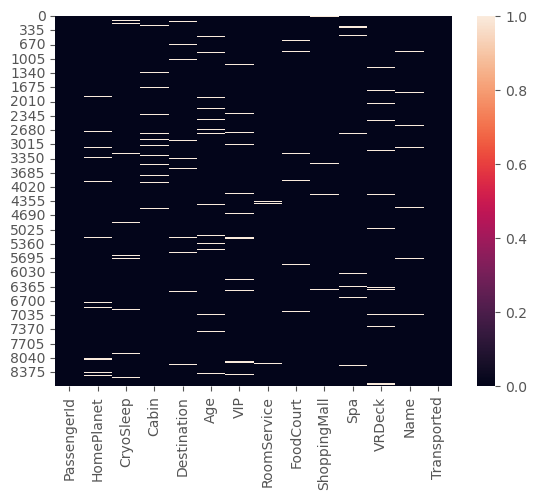

In [19]:
sns.heatmap(df_train.isnull());

<Axes: >

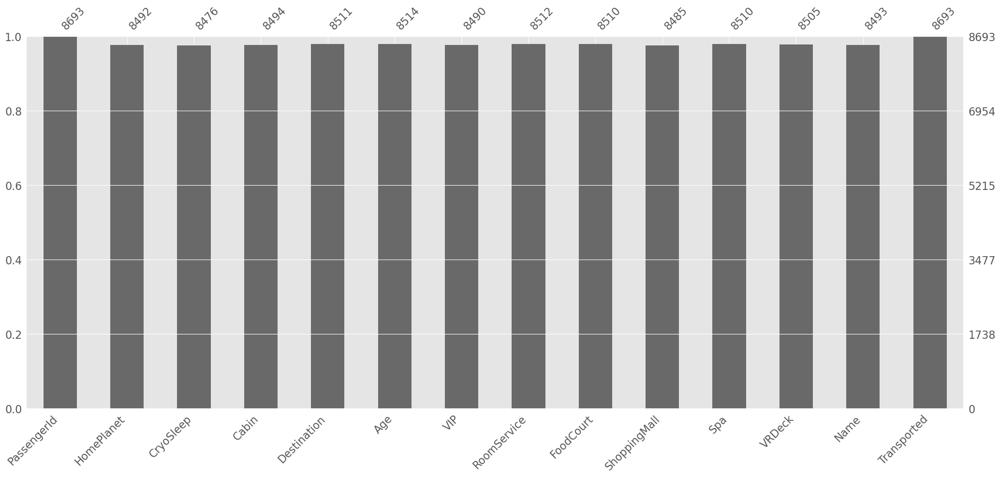

In [65]:
missingno.bar(df_train)

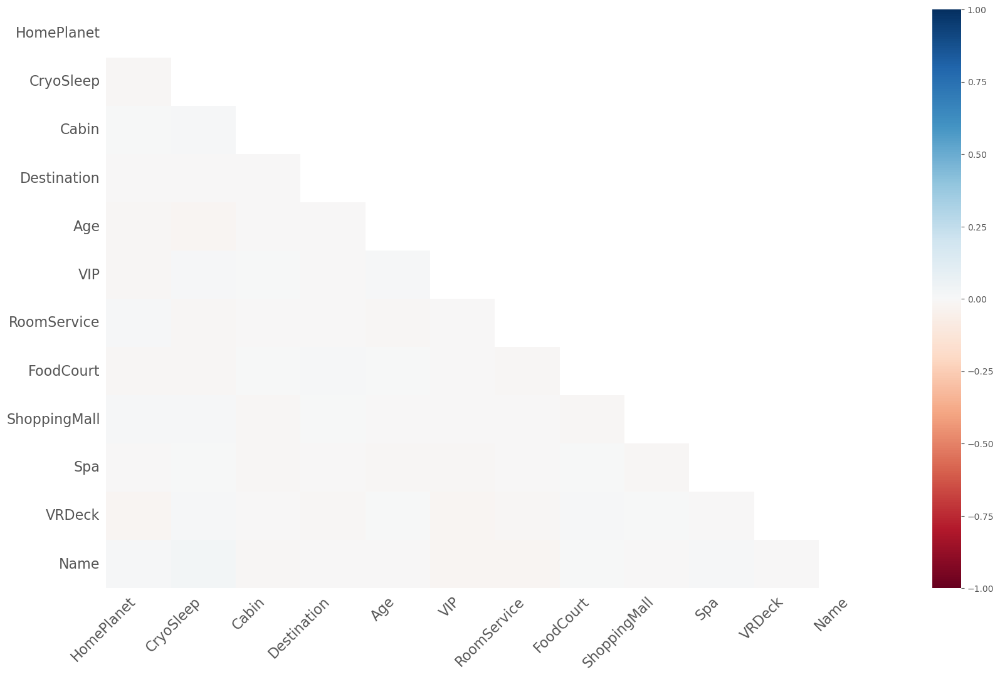

In [20]:
#Relation of nullity
msno.heatmap(df=df_train);

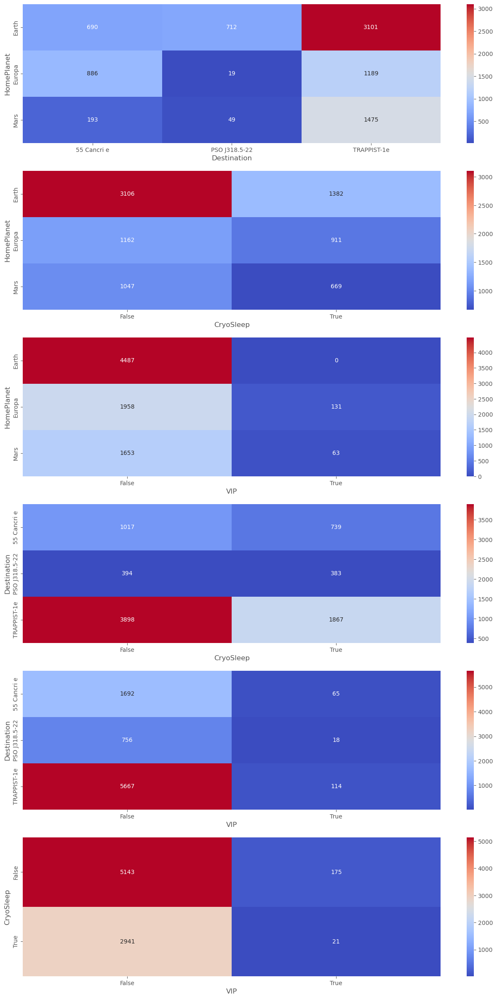

In [25]:
categorical_vars = ['HomePlanet',  'Destination', 'CryoSleep', 'VIP']
AnalysisForRBI(df_train,categorical_vars=categorical_vars)

<h3><mark> Results:</mark></h3>

- All variables have missing values except PassengerId and Transported
- In train set , there is no relation between missing values in different variables 
- Na percentage is approximately 2. So <mark>imputing</mark> or <mark>dropping</mark> rows are in choice. Imputing them maybe affect the performance slightly
>--------
- There is no duplicated rows
- Duplicated Name and Cabin(+Group Number too) seems interesting. Analysing them maybe give some useful information
- Age = 0 values should be analysed
>-------
- All rows of PassengerId are unique. So after splitting group number, I should drop it <mark><b>!
>--------
- <mark><b>(New feature)</mark></b> A new feature named 'Expenses' is sum of RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
- <mark><b>(New feature)</mark></b> A new feature named 'NoExpense' is True if Expenses equals 0
- <mark><b>(New feature)</mark></b> A new feature named 'FamilyExpense' is total Expenses of family
- <mark><b>(New feature)</mark></b> A new feature named 'GroupTotalExpense' is total expense of group
- <mark><b>(New feature)</mark></b> A new feature named 'NumAmenitiesUsed' is number of used amenities
- <mark><b>(New feature)</mark></b> A new feature named 'LuxuryExpense' is total expense of Spa and VRDeck
- <mark><b>(New feature)</mark></b> A new feature named 'NecessityExpense' is total expense of RoomService, FoodCourt and ShoppingMall
- <mark><b>(New feature)</mark></b> A new feature named 'GroupMeanAge' is mean age of passenger's group
- <mark><b>(New feature)</mark></b> A new feature named 'IsMinor' is control of is age under 18
- <mark><b>(New feature)</mark></b> A new feature named 'AgeGroup' is binning age
- <mark><b>(New feature)</mark></b> A new feature named 'CabinGroupSize' is number of passenger in same Cabin
- <mark><b>(New feature)</mark></b> A new feature named 'GroupBin' is binning Group Number
>--------
* (In Analysis For Rule-Based Imputation)
    * I can only say, <mark style="color:red; background-color:black">VIP is False if passenger is from Earth (%100)    
    * <mark><b>(New feature)</mark></b> A new feature named 'HomePlanet_Destination' is combination of HomePlanet and Destination. Models can use this feature to capture the probability between HomePlanet and Destination.
    * I will look other probabilities after Feature Engineering step        

## Checking Missing Values in both set

In [21]:
na_df = pd.DataFrame(df_train.drop('Transported',axis=1).isna().sum(),columns=['Train_Na_Sum'])
na_df['Test_Na_Sum'] = df_test.isna().sum()
display(na_df)
print('Number of Na of Survived (Target) in Train',df_train['Transported'].isna().sum())

,Train_Na_Sum,Test_Na_Sum
PassengerId,0,0
HomePlanet,201,87
CryoSleep,217,93
Cabin,199,100
Destination,182,92
Age,179,91
VIP,203,93
RoomService,181,82
FoodCourt,183,106
ShoppingMall,208,98


Number of Na of Survived (Target) in Train 0


> <mark >na number ratio is approximately equal data size ratio between train and test set

## Feature Distribution and Univariate Outlier Visualization

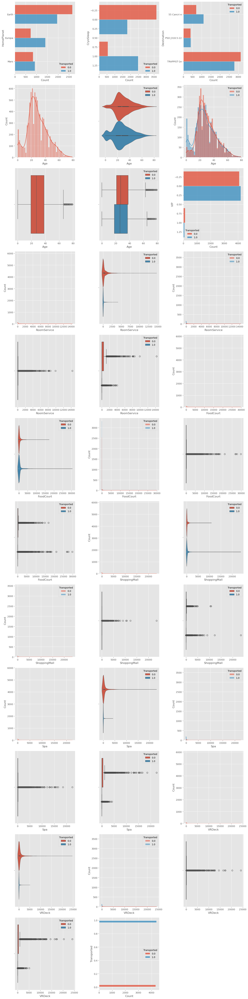

In [27]:
feature_distr(df_train.drop(columns=['PassengerId','Name','Cabin'],axis=1),'Transported')

In [262]:
## Categorical
variable_name_cat = 'HomePlanet'

display(df_train[variable_name_cat].value_counts(normalize=True)*100)
print('-'*20,'\n')
display(pd.crosstab(df_train[variable_name_cat],df_train['Transported'],normalize='index')*100)

HomePlanet
Earth     54.192181
Europa    25.094206
Mars      20.713613
Name: proportion, dtype: float64

-------------------- 



Transported,0.0,1.0
HomePlanet,,
Earth,57.605389,42.394611
Europa,34.115439,65.884561
Mars,47.697555,52.302445


In [267]:
## Numerical
variable_name = 'VRDeck'

print('Transported distribution')
display( df_train.loc[ (df_train[variable_name]==0) & (df_train[variable_name]==0) ]['Transported'].value_counts(normalize=True)*100)

print('-'*20,'\n',variable_name,'distribution in specified range')
display(df_train.loc[df_train[variable_name]<=20][variable_name].value_counts(normalize=True)*100)

print('-'*20,'\n','Most values percentage in dataset')
display(df_train[variable_name].value_counts(normalize=True)[0:15])
print('-'*20,'\n','Total:')
display(df_train[variable_name].value_counts(normalize=True)[0:15].sum())

Transported distribution


Transported
1.0    62.802548
0.0    37.197452
Name: proportion, dtype: float64

-------------------- 
 VRDeck distribution in specified range


VRDeck
0.0     89.262508
1.0      2.257960
2.0      1.137102
3.0      0.909682
5.0      0.828460
4.0      0.763483
6.0      0.519818
8.0      0.487329
7.0      0.471085
9.0      0.406108
12.0     0.357375
10.0     0.357375
13.0     0.324886
16.0     0.308642
11.0     0.276153
15.0     0.259909
19.0     0.243665
18.0     0.243665
17.0     0.227420
14.0     0.194932
20.0     0.162443
Name: proportion, dtype: float64

-------------------- 
 Most values percentage in dataset


VRDeck
0.0     0.646091
1.0     0.016343
2.0     0.008230
3.0     0.006584
5.0     0.005996
4.0     0.005526
6.0     0.003762
8.0     0.003527
7.0     0.003410
9.0     0.002939
12.0    0.002587
10.0    0.002587
13.0    0.002352
16.0    0.002234
23.0    0.002116
11.0    0.001999
15.0    0.001881
Name: proportion, dtype: float64

-------------------- 
 Total:


0.7181657848324514

<mark><b>HomePlanet => 

- from Earth %57.6 not transported, %42.4 transported
- From Europa %34.1 not transported, %65.9  transported
- From Mars %47.7 not transported, %52.3  transported
> ------
- %54.2 of people are from Earth
- %25 of people are from Europa
- %20.8 of people are from Mars

<mark><b>CryoSleep =>

- %66 no cryosleep , %33 yes cryosleep
> --------
- People in cryosleep are %16.7 not transported , 83.3 transported
- People not in cryosleep are 66.6 not transported ,33.3 transported

<mark><b> Destination =>
- TRAPPIST-1e --- %39 not transported, %61 Transported
- 55 Cancri e --- %49.6 not transported, %50.4 Transported
- PSO J318.5-22 --- %52.9 not transported, %47.1 Transported
> --------
- %68 of people are from TRAPPIST-1e  
- %21 of people are from 55 Cancri e- %9 of people are from PSO J318.5-22

<mark><b> Age

- Seems like normal distribution
- When age is under 18 , Mostly Transported is True (%63)
- When age is greater than 18 , %47.6 Transported is True ,%52.4 False
- People are mostly aged 15-35

<mark><b> VIP </mark> => <mark style=" color:red ; background-color:black "> IMBALANCED
- False --- %49.4 not transported, %50.6 Transported
- True --- %61.8 not transported, %38.2 Transported
> --------
- <b>%97.7 </b>of people are from False
- %2.3 of people are from True

<mark><b> RoomService

- %70 is lower than 20 , <b>%65 is 0 </b>
- RoomService = 0   ===> %40.9 not Transported, %59.1 Transported
- 0< RoomService <=20  ===> %64.1 not Transported, %35.9 Transported
- RoomService > 20   ===> %76.4 not Transported, %23.5 Transported

<mark style=" color:red ; background-color:black "> Lower RoomService is higher transporting probability 

<mark><b> FoodCourt

- %70 is lower than 20 , <b>%64.1 is 0 </b>
- FoodCourt = 0   ===> %40.9 not Transported, %59.1 Transported
- 0< FoodCourt <=20  ===> %78.7 not Transported, %21.3 Transported
- FoodCourt > 20   ===> %62.4 not Transported, %37.6 Transported

<mark style=" color:red ; background-color:black ">  When FoodCourt is equal 0, being Transported is higher  probability 

<mark><b> ShoppingMall

- %75 is lower than 20 , <b>%65.8 is 0 </b>
- ShoppingMall = 0   ===> %40.1 not Transported, %59.9 Transported
- 0< ShoppingMall <=20  ===> %76.4 not Transported, %23.6 Transported
- ShoppingMall > 20   ===> %65.7 not Transported, %34.3 Transported

<mark style=" color:red ; background-color:black ">  When ShoppingMall is equal 0, being Transported is higher  probability 

<mark><b> Spa

- %69.8 is lower than 20 , <b>%62.6 is 0 </b>
- Spa = 0   ===> %36.1 not Transported, %63.9 Transported
- 0< Spa <=20  ===> %60.5 not Transported, %39.5 Transported
- Spa > 20   ===> %75.7 not Transported, %24.3 Transported

<mark style=" color:red ; background-color:black ">  Lower Spa is higher transporting probability

<mark><b> VRDeck

- %73.7 is lower than 20 , <b>%64.6 is 0 </b>
- VRDeck = 0   ===> %37.2 not Transported, %62.8 Transported
- 0< VRDeck <=20  ===> %63.8 not Transported, %36.2 Transported
- VRDeck > 20   ===> %74.9 not Transported, %25.1 Transported

<mark style=" color:red ; background-color:black ">  Lower VRDeck is higher transporting probability

## Statistical Measurement to understand relationship between features

In [89]:
imp_vars = ['HomePlanet', 'CryoSleep', 'Destination', 'Age',
       'VIP', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck',
        'Transported']
df_train_rel = df_train.copy()

In [90]:
df_train_rel['HomePlanet'] = df_train_rel['HomePlanet'].map({'Mars':1,'Europa':2,'Earth':3})
df_train_rel['CryoSleep'] = df_train_rel['CryoSleep'].map({False:0,True:1})
df_train_rel['Destination'] = df_train_rel['Destination'].map({'TRAPPIST-1e':2,'55 Cancri e':1,'PSO J318.5-22':0})
df_train_rel['VIP'] = df_train_rel['VIP'].map({False:0,True:1})
knn_imp = KNNImputer()
df_train_rel[imp_vars] = knn_imp.fit_transform(df_train_rel[imp_vars],df_train_rel['Transported'])

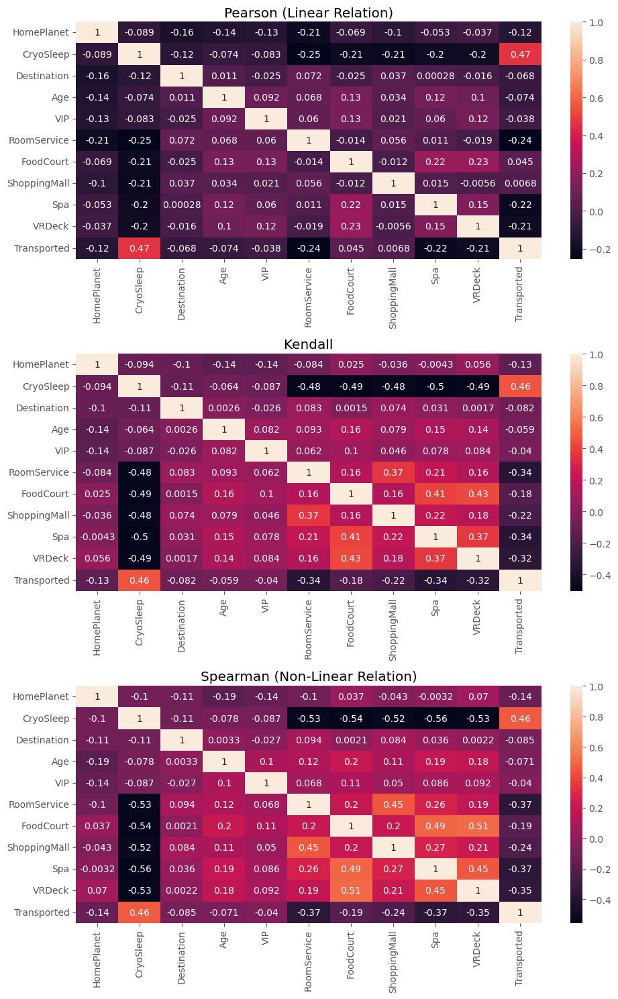

Transported     0.695422
CryoSleep       0.115399
RoomService     0.075957
Spa             0.071552
VRDeck          0.064375
ShoppingMall    0.049262
FoodCourt       0.043203
HomePlanet      0.029783
Age             0.017366
Destination     0.007320
VIP             0.000000
dtype: float64

In [101]:
display_corr(df_train_rel,imp_vars,'Transported')

<h3><mark>CryoSleep and Expenses Relation</mark></h3>

In [86]:
display(df_train.loc[df_train['CryoSleep']==True]['RoomService'].value_counts())
display(df_train.loc[df_train['CryoSleep']==True]['FoodCourt'].value_counts())
display(df_train.loc[df_train['CryoSleep']==True]['ShoppingMall'].value_counts())
display(df_train.loc[df_train['CryoSleep']==True]['Spa'].value_counts())
display(df_train.loc[df_train['CryoSleep']==True]['VRDeck'].value_counts())

RoomService
0.0    2969
Name: count, dtype: int64

FoodCourt
0.0    2967
Name: count, dtype: int64

ShoppingMall
0.0    2941
Name: count, dtype: int64

Spa
0.0    2972
Name: count, dtype: int64

VRDeck
0.0    2975
Name: count, dtype: int64

- This result shows that when the passenger is in CryoSleep , he/she doesn't spend any money

<h3><mark> Results:</mark></h3>

- It seems CryoSleep is most important feature
- RoomService, Spa, VRDeck, ShoppingMall and FoodCourt features are second most important features. Also they are inverse related with CryoSleep. I expected this relation because when the passenger is in CryoSleep, he/she is confined to his/her cabin.<mark style=" color:red ; background-color:black "> So, if CryoSleep is True Expenses will be 0 . It is useful info for Rule-Based Imputation
- RoomService, Spa and VRDeck are <b>inverse</b> related with target feature
- FoodCourt has nonlinear relation with VRDeck and Spa
- Spa and VRDeck related (nonlinear)
- RoomService and ShoppingMall related (nonlinear)
- VIP has any relation with target feature and any other features. So i can drop it after rule-based imputation step <mark><b>!</b>

# Feature Engineering

In [75]:
df_fe = df_train.copy()
df_test_fe = df_test.copy()

In [76]:
df_fe = FeatureEngineering().fit_transform(df_fe)

In [77]:
df_fe.to_csv('processed_train.csv', index=False)

In [22]:
# Names (first_name+last_name) repeat more than once
duplicated_names = list(df_fe[df_fe.duplicated(subset=['Name'],keep=False)]['Name'].value_counts().index)

<mark> <b >I checked duplicated names. They are pointing different person with different Age,Group,Cabin

In [63]:
basicEDA(df_fe.drop(df_train.columns,axis=1))

'Number of NaN in Rows'

0    7606
1     590
4     196
3     181
2      99
5      15
6       4
8       1
7       1
Name: count, dtype: int64

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Group,continuous numerical,0,0.0,6217,3888,145,984,4630.0,4633.389624,2671.028856,1,9280


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Group,92.0,465.6,931.2,1851.2,2319.0,2791.2,3741.8,4630.0,5561.0,6431.0,6883.0,7387.6,8344.8,8819.4,9184.08


,HasNeg,HasZero
Group,False,False


Unique values cutted early(0:200):
 [  1   2   3   4   5   6   7   8   9  10  11  12  14  15  16  17  20  22
  24  25  26  28  30  31  34  35  36  38  39  41  43  44  45  50  51  52
  53  56  58  61  62  64  66  67  68  69  70  71  72  73  74  76  77  78
  81  82  84  85  86  88  90  91  92  97  98  99 101 102 103 105 107 108
 110 111 112 113 114 115 116 119 120 122 123 126 127 128 129 133 134 136
 138 139 140 141 144 146 147 148 149 151 152 160 163 164 165 167 169 170
 171 172 173 174 177 178 179 181 182 183 186 188 189 190 192 193 195 196
 197 198 199 200 201 202 203 205 206 207 210 211 212 213 216 217 219 220
 221 222 223 224 225 229 231 232 233 234 237 239 240 241 242 243 244 245
 246 248 250 251 252 253 254 255 257 258 260 261 263 265 267 269 270 275
 277 278 281 282 283 285 286 287 288 289 290 291 294 297 298 301 302 303
 304 305]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
GroupSize,discrete,0,0.0,8,8693,145,1,1.0


GroupSize,1,2,3,4,5,7,6,8
count,4805,1682,1020,412,265,231,174,104




Unique values:
 [1 2 3 6 4 7 5 8]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
GroupMeanAge,continuous numerical,97,1.11584,335,8691,145,22.0,27.0,28.802818,12.147281,0.0,79.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
GroupMeanAge,6.658333,11.625,15.0,19.0,20.0,21.571428,24.0,27.0,30.0,34.0,36.0,38.0,45.0,52.0,63.0


,HasNeg,HasZero
GroupMeanAge,False,True


Unique values cutted early(0:200):
 [39.        24.        45.5       16.        44.        27.
 35.        31.        32.        48.        28.        45.
  7.        16.166666  21.        62.        15.        34.
 43.        23.        20.        30.        17.        26.666666
 56.               nan 25.        22.333334  36.        22.
 13.        42.        19.        14.        37.        38.
 17.333334  40.        26.5        7.3333335 54.        26.
 12.5       18.        35.5       29.        64.        33.
 67.        53.        27.5       47.        23.5       50.
 41.        21.5       58.        49.        11.         8.333333
 52.        51.        10.285714  28.142857  28.5       39.5
 40.5       63.        25.5       57.        33.5       23.75
 36.333332  19.5       59.         5.        43.5       46.
 27.333334  60.        49.666668  23.666666  42.333332  37.666668
 55.        10.666667  30.5       36.5       31.666666  38.5
  1.        41.5       38.25      37.5    

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
IsAlone,discrete,0,0.0,2,8693,145,1,1.0


IsAlone,1,0
count,4805,3888




Unique values:
 [1 0]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
FamilySize,discrete,200,2.300702,8,8693,145,1.0,1.0


FamilySize,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
count,5040,1768,894,356,205,108,98,24




Unique values:
 [ 1.  2.  3. nan  7.  6.  4.  5.  8.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
HasFamily,discrete,0,0.0,2,8693,145,0,0.0


HasFamily,0,1
count,5240,3453




Unique values:
 [0 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Expense,continuous numerical,0,0.0,2336,7170,145,0.0,716.0,1440.866333,2803.074463,0.0,35987.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Expense,0.0,0.0,0.0,0.0,0.0,0.0,0.0,716.0,842.2,1143.4,1441.0,1873.6,3838.4,6457.6,14562.76


,HasNeg,HasZero
Expense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 7.3600e+02 1.0383e+04 5.1760e+03 1.0910e+03 7.7400e+02
 1.5840e+03 1.0180e+03 8.1570e+03 1.3090e+03 8.0900e+02 1.0030e+03
 9.0800e+02 1.4080e+03 6.3800e+02 1.0920e+03 1.0510e+03 1.2230e+03
 7.8610e+03 1.8210e+03 2.8540e+03 2.7400e+03 2.6990e+03 9.6100e+02
 3.3550e+03 3.5750e+03 1.2140e+03 7.9000e+02 1.6180e+03 4.6890e+03
 1.9390e+03 4.5470e+03 2.6670e+03 6.3400e+02 8.1100e+02 7.0500e+02
 2.0070e+03 1.0480e+03 9.0200e+02 9.2200e+02 2.2330e+03 1.0640e+03
 8.7900e+02 8.9040e+03 1.1650e+03 1.5815e+04 7.4060e+03 1.3620e+03
 9.1700e+02 1.8480e+03 8.9300e+02 3.8550e+03 1.3010e+03 9.2100e+02
 1.7000e+01 7.0300e+02 1.7650e+03 8.8800e+02 5.1090e+03 2.0180e+03
 1.5940e+04 2.6540e+03 8.0400e+02 9.0700e+02 2.6400e+03 9.3070e+03
 7.7300e+02 7.0200e+02 1.0220e+03 3.0140e+03 2.1090e+03 2.7380e+03
 7.4400e+02 7.2100e+02 7.9300e+02 9.7000e+01 6.3000e+02 1.1580e+03
 6.0700e+02 4.1800e+03 1.8730e+03 1.5720e+03 7.8800e+02 9.9000e+02
 5.9300e+02 2.7428e+04 3.7

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
HasExpense,discrete,0,0.0,2,8693,145,1,1.0


HasExpense,1,0
count,5040,3653




Unique values:
 [0 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
GroupTotalExpense,continuous numerical,0,0.0,2209,7868,145,0.0,949.0,2988.116943,5454.26123,0.0,52668.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
GroupTotalExpense,0.0,0.0,0.0,0.0,0.0,652.0,793.0,949.0,1448.0,2285.8,2796.0,3744.0,8029.2,14314.4,27973.04


,HasNeg,HasZero
GroupTotalExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 7.3600e+02 1.5559e+04 1.0910e+03 7.7400e+02 1.5840e+03
 1.0180e+03 8.1570e+03 1.3090e+03 8.0900e+02 1.0030e+03 9.0800e+02
 1.4080e+03 6.3800e+02 1.0920e+03 1.0510e+03 1.2230e+03 7.8610e+03
 1.8210e+03 5.5940e+03 2.6990e+03 9.6100e+02 3.3550e+03 3.5750e+03
 1.2140e+03 7.9000e+02 1.6180e+03 4.6890e+03 1.9390e+03 4.5470e+03
 2.6670e+03 6.3400e+02 8.1100e+02 2.7120e+03 1.0480e+03 9.0200e+02
 9.2200e+02 2.2330e+03 1.0640e+03 8.7900e+02 8.9040e+03 1.1650e+03
 1.5815e+04 7.4060e+03 7.0500e+02 1.3620e+03 9.1700e+02 1.8480e+03
 4.7480e+03 1.3010e+03 9.2100e+02 1.7000e+01 7.0300e+02 1.7650e+03
 8.8800e+02 2.3067e+04 2.6540e+03 8.0400e+02 9.0700e+02 2.6400e+03
 9.3070e+03 7.7300e+02 7.0200e+02 1.0220e+03 5.1230e+03 2.7380e+03
 7.4400e+02 7.2100e+02 7.9300e+02 9.7000e+01 6.3000e+02 1.1580e+03
 6.0700e+02 4.1800e+03 1.8730e+03 1.5720e+03 7.8800e+02 9.9000e+02
 5.9300e+02 2.7428e+04 3.7220e+03 9.0600e+02 3.9400e+02 8.2100e+02
 1.0800e+03 1.2730e+03 1.7

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
FamilyExpense,continuous numerical,200,2.300702,2203,7813,145,0.0,902.0,2606.272949,4735.183105,0.0,45970.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
FamilyExpense,0.0,0.0,0.0,0.0,0.0,595.0,783.0,902.0,1308.2,2014.2,2570.0,3288.0,6790.0,12569.0,23943.0


,HasNeg,HasZero
FamilyExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 7.3600e+02 1.5559e+04 1.0910e+03 7.7400e+02 1.5840e+03
 1.0180e+03 8.1570e+03 1.3090e+03 8.0900e+02 1.0030e+03 9.0800e+02
 1.4080e+03 6.3800e+02 1.0920e+03        nan 1.2230e+03 7.8610e+03
 1.8210e+03 5.5940e+03 2.6990e+03 9.6100e+02 3.3550e+03 3.5750e+03
 1.2140e+03 7.9000e+02 1.6180e+03 4.6890e+03 1.9390e+03 4.5470e+03
 2.6670e+03 6.3400e+02 8.1100e+02 2.7120e+03 1.0480e+03 9.2200e+02
 2.2330e+03 1.0640e+03 8.7900e+02 8.9040e+03 1.1650e+03 1.5815e+04
 7.4060e+03 7.0500e+02 1.3620e+03 9.1700e+02 1.8480e+03 4.7480e+03
 1.3010e+03 9.2100e+02 1.7000e+01 7.0300e+02 1.7650e+03 2.1049e+04
 2.0180e+03 2.6540e+03 8.0400e+02 9.0700e+02 2.6400e+03 9.3070e+03
 7.7300e+02 7.0200e+02 1.0220e+03 5.1230e+03 2.7380e+03 7.4400e+02
 7.9300e+02 9.0200e+02 9.7000e+01 6.3000e+02 1.1580e+03 6.0700e+02
 4.1800e+03 1.8730e+03 1.5720e+03 7.8800e+02 9.9000e+02 5.9300e+02
 2.7428e+04 3.7220e+03 9.0600e+02 3.9400e+02 8.2100e+02 1.0800e+03
 1.2730e+03 1.7780e+03 2.3

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
NumAmenitiesUsed,discrete,0,0.0,6,8693,145,0,2.0


NumAmenitiesUsed,0,3,4,2,1,5
count,3653,2068,1225,1224,271,252




Unique values:
 [0 5 4 2 3 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
NecessityExpense,continuous numerical,0,0.0,2353,7374,145,0.0,53.0,838.015625,1823.12854,0.0,29813.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
NecessityExpense,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,493.0,784.0,898.0,1180.0,2253.4,3739.4,8760.44


,HasNeg,HasZero
NecessityExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 1.4300e+02 3.6190e+03 1.6540e+03 5.2400e+02 4.8300e+02
 1.5840e+03 8.0200e+02 7.9230e+03 1.1960e+03 7.8500e+02 9.9400e+02
 9.0800e+02 1.4080e+03 1.0000e+00 4.1300e+02 1.0510e+03 2.2500e+02
 6.0950e+03 1.2610e+03 9.3100e+02 1.6250e+03 1.7500e+03 1.7480e+03
 5.4000e+02 7.4900e+02 2.0900e+02 1.1500e+03 7.9000e+02 1.1200e+02
 6.0000e+00 1.9380e+03 4.2580e+03 1.2890e+03 5.9200e+02 3.5100e+02
 7.0500e+02 1.9830e+03 7.9500e+02 8.9600e+02 1.9500e+02 2.1810e+03
 8.6700e+02 8.3980e+03 1.1650e+03 1.3090e+03 5.8400e+03 7.4060e+03
 6.8800e+02 2.1100e+02 7.2900e+02 6.7000e+02 1.2080e+03 8.6100e+02
 3.7680e+03 1.2640e+03 5.7000e+02 1.7650e+03 8.8800e+02 4.1600e+02
 3.3100e+02 1.3627e+04 2.6240e+03 8.0400e+02 6.6800e+02 2.2240e+03
 2.3440e+03 7.0100e+02 9.9700e+02 2.6960e+03 2.1090e+03 2.7380e+03
 7.4400e+02 6.4100e+02 2.2000e+01 4.4000e+02 9.7000e+01 6.3000e+02
 1.0820e+03 4.1190e+03 1.7380e+03 1.4130e+03 9.8500e+02 3.0300e+02
 1.0347e+04 3.5750e+03 8.9

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
LuxuryExpense,continuous numerical,0,0.0,1898,7549,145,0.0,0.0,602.850708,1711.71875,0.0,28600.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
LuxuryExpense,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,275.4,503.0,695.6,1505.8,3324.8,8763.24


,HasNeg,HasZero
LuxuryExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 5.9300e+02 6.7640e+03 3.5220e+03 5.6700e+02 2.9100e+02
 2.1600e+02 2.3400e+02 1.1300e+02 2.4000e+01 9.0000e+00 6.3700e+02
 6.7900e+02 9.9800e+02 1.7660e+03 4.8000e+01 8.9000e+02 1.2290e+03
 9.9000e+02 9.5100e+02 4.2100e+02 2.6060e+03 3.3660e+03 6.4000e+01
 1.5060e+03 4.6830e+03 1.0000e+00 2.8900e+02 1.3780e+03 4.2000e+01
 4.6000e+02 2.5300e+02 6.0000e+00 7.2700e+02 5.2000e+01 1.0630e+03
 1.2000e+01 5.0600e+02 9.9750e+03 1.7000e+01 1.1510e+03 1.8800e+02
 3.5000e+01 6.4000e+02 3.2000e+01 8.7000e+01 3.7000e+01 9.2100e+02
 1.3300e+02 4.6930e+03 1.6870e+03 2.3130e+03 3.0000e+01 2.3900e+02
 4.1600e+02 6.9630e+03 7.7300e+02 2.5000e+01 3.1800e+02 8.0000e+01
 7.7100e+02 4.6200e+02 7.6000e+01 6.0700e+02 6.1000e+01 1.3500e+02
 1.5900e+02 7.8800e+02 5.0000e+00 2.9000e+02 1.7081e+04 1.4700e+02
 1.3000e+01 3.9100e+02 2.3200e+02 9.5600e+02 3.0000e+02 8.9800e+02
 1.0720e+03 7.0000e+00 1.3700e+03 1.3210e+03 7.0500e+02 1.2470e+03
 1.8200e+02 7.9000e+02 3.9

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
CabinNum,continuous numerical,199,2.289198,1817,8425,145,82.0,427.0,600.367676,511.867157,0.0,1894.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
CabinNum,6.0,31.0,64.0,129.0,167.25,204.0,282.0,427.0,610.8,876.0,999.0,1126.0,1405.7,1569.35,1794.21


,HasNeg,HasZero
CabinNum,False,True


Unique values cutted early(0:200):
 [  0.   1.   2.   3.  nan   4.   5.   6.   8.   9.  10.  11.   7.  12.
  13.  14.  15.  16.  17.  18.  20.  19.  23.  24.  21.  25.  27.  22.
  29.  30.  31.  26.  32.  28.  37.  35.  38.  36.  41.  42.  33.  34.
  44.  45.  46.  40.  47.  48.  43.  50.  52.  53.  54.  49.  56.  51.
  59.  61.  63.  64.  65.  55.  67.  60.  68.  72.  73.  62.  74.  57.
  76.  78.  66.  82.  83.  84.  85.  69.  89.  90.  71.  91.  92.  96.
  75.  97.  77.  79.  98.  99.  80.  81. 100. 101.  86.  87. 103.  70.
  88. 109.  93. 110.  95. 111. 102. 114. 115. 116. 105. 117. 107. 108.
 118. 120. 121.  39. 123. 124. 125. 126.  94. 128. 129. 131. 133. 112.
 113. 135. 136. 137. 138. 140. 141. 142. 143. 104. 144. 145. 146. 122.
 147. 127. 149. 150. 132. 134. 153. 154. 156. 157. 161. 162. 163. 165.
 166. 119. 148. 151. 152. 169. 158. 159. 170. 171. 173. 160. 175. 176.
 130. 164. 180. 184. 187. 167. 188. 168. 189. 190. 139. 191. 192. 193.
 194. 172. 195. 196. 198. 199. 201. 178. 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
CabinGroupSize,discrete,199,2.289198,8,8693,145,1.0,1.0


CabinGroupSize,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
count,5427,1372,747,416,235,198,91,8




Unique values:
 [ 1.  2.  3. nan  6.  5.  7.  4.  8.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
IsMinor,discrete,0,0.0,2,8693,145,0,0.0


IsMinor,0,1
count,7148,1545




Unique values:
 [0 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
LastName,categorical,200,2.300702,2217,8311,145,Casonston


Unique values cutted early(0:200):
 ['Ofracculy' 'Vines' 'Susent' 'Santantines' 'Hinetthews' 'Jacostaffey'
 'Beston' 'Flatic' 'Barne' 'Baketton' 'Bertsontry' 'Pooles' 'Eccle'
 'Hughriend' 'Upead' 'Brighttt' 'Brantuarez' 'Mcfaddennon' 'Jacostanley'
 nan 'Fullided' 'Brookenson' 'Unconary' 'Mare' 'Morsentley' 'Datie'
 'Oingwhedly' 'Butte' 'Leodger' 'Wheelez' 'Batthewitt' 'Moodsey'
 'Cylistrand' 'Coopelandez' 'Chmad' 'Lancis' 'Johnshines' 'Hubbarton'
 'Hickerson' 'Tractive' 'Ayalazquez' 'Salez' 'Greeves' 'Keen' 'Pecketton'
 'Leeves' 'Binie' 'Dillines' 'Make' 'Mostedry' 'Dal' 'Blité' 'Pokerheed'
 'Vinozarks' 'Datte' 'Coopezmaney' 'Ellcefulve' 'Kinson' 'Sacre' 'Santry'
 'Yorkland' 'Dunnisey' 'Hewson' 'Fictful' 'Carezquez' 'Leetersoney'
 'Connelson' 'Trad' 'Holson' 'Mclainez' 'Cleachrand' 'Hart' 'Handertiz'
 'Aloubtled' 'Bootious' 'Supred' 'Cowtale' 'Carvis' 'Beckerson' 'Pead'
 'Suptive' 'Coning' 'Hayder' 'Fielson' 'Mish' 'Mesty' 'Fles' 'Fowles'
 'Blie' 'Harmontry' 'Gambs' 'Myling' 'Mejiaddox

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
CabinDeck,categorical,199,2.289198,8,8693,145,F


CabinDeck,F,G,E,B,C,D,A,T
count,2794,2559,876,779,747,478,256,5




Unique values:
 ['B', 'F', 'A', 'G', NaN, 'E', 'D', 'C', 'T']
Categories (8, object): ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'T']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
CabinSide,categorical,199,2.289198,2,8693,145,S


CabinSide,S,P
count,4288,4206




Unique values:
 ['P', 'S', NaN]
Categories (2, object): ['P', 'S']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
AgeBin,categorical,357,4.106753,5,8693,145,Young Adult


AgeBin,Young Adult,Adult,Teen,Child,Senior
count,4136,2293,1059,628,220




Unique values:
 ['Adult', 'Young Adult', 'Teen', NaN, 'Child', 'Senior']
Categories (5, object): ['Child' < 'Teen' < 'Young Adult' < 'Adult' < 'Senior']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
GroupBin,categorical,0,0.0,20,8693,145,GroupBin13




Unique values:
 ['GroupBin1', 'GroupBin2', 'GroupBin3', 'GroupBin4', 'GroupBin5', ..., 'GroupBin16', 'GroupBin17', 'GroupBin18', 'GroupBin19', 'GroupBin20']
Length: 20
Categories (20, object): ['GroupBin1' < 'GroupBin2' < 'GroupBin3' < 'GroupBin4' ... 'GroupBin17' < 'GroupBin18' < 'GroupBin19' < 'GroupBin20']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
HomePlanet_Destination,categorical,379,4.35983,9,8693,145,Earth->TRAPPIST-1e


HomePlanet_Destination,Earth->TRAPPIST-1e,Mars->TRAPPIST-1e,Europa->TRAPPIST-1e,Europa->55 Cancri e,Earth->PSO J318.5-22,Earth->55 Cancri e,Mars->55 Cancri e,Mars->PSO J318.5-22,Europa->PSO J318.5-22
count,3101,1475,1189,886,712,690,193,49,19




Unique values:
 ['Europa->TRAPPIST-1e', 'Earth->TRAPPIST-1e', 'Earth->PSO J318.5-22', 'Europa->55 Cancri e', 'Mars->TRAPPIST-1e', 'Mars->55 Cancri e', 'Earth->55 Cancri e', NaN, 'Mars->PSO J318.5-22', 'Europa->PSO J318.5-22']
Categories (9, object): ['Earth->55 Cancri e', 'Earth->PSO J318.5-22', 'Earth->TRAPPIST-1e', 'Europa->55 Cancri e', ..., 'Europa->TRAPPIST-1e', 'Mars->55 Cancri e', 'Mars->PSO J318.5-22', 'Mars->TRAPPIST-1e']


Variables and their types on table

Number of numerical variables => 16 
Numerical Variables=> ['Group', 'GroupSize', 'GroupMeanAge', 'IsAlone', 'FamilySize', 'HasFamily', 'Expense', 'HasExpense', 'GroupTotalExpense', 'FamilyExpense', 'NumAmenitiesUsed', 'NecessityExpense', 'LuxuryExpense', 'CabinNum', 'CabinGroupSize', 'IsMinor']
Number of continuous variables => 8 
Continuous Variables=> ['Group', 'GroupMeanAge', 'Expense', 'GroupTotalExpense', 'FamilyExpense', 'NecessityExpense', 'LuxuryExpense', 'CabinNum']
Number of numerical discrete variables => 4 

In [164]:
num_vars,cnt_vars,num_dsc,cat_dsc,bin_vars,cat_vars = checkNumCat(df_fe,printVars=True,printClasses=False)

Number of numerical variables => 23 
Numerical Variables=> ['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Transported', 'Group', 'GroupSize', 'GroupMeanAge', 'IsAlone', 'FamilySize', 'HasFamily', 'Expense', 'HasExpense', 'GroupTotalExpense', 'FamilyExpense', 'NumAmenitiesUsed', 'NecessityExpense', 'LuxuryExpense', 'CabinNum', 'CabinGroupSize', 'IsMinor']
Number of continuous variables => 14 
Continuous Variables=> ['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Group', 'GroupMeanAge', 'Expense', 'GroupTotalExpense', 'FamilyExpense', 'NecessityExpense', 'LuxuryExpense', 'CabinNum']
Number of numerical discrete variables => 4 
Numerical Discrete Variables=> ['GroupSize', 'FamilySize', 'NumAmenitiesUsed', 'CabinGroupSize']
Number of categorical discrete variables => 6 
Categorical Discrete Variables=> ['HomePlanet', 'Destination', 'CabinDeck', 'AgeBin', 'GroupBin', 'HomePlanet_Destination']
Number of binary variables => 8 
Binary Variables=> ['

### Feature Distribution

In [157]:
imp_vars_fe = list(df_fe.drop(df_train.columns,axis=1).columns)
imp_vars_fe.append('Transported')

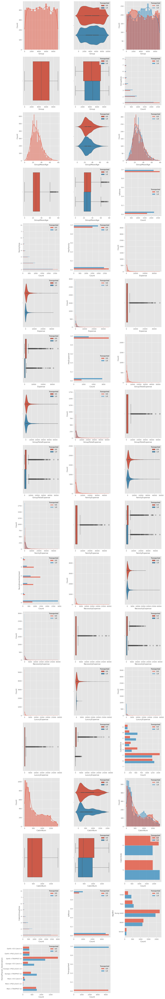

In [159]:
feature_distr(df_fe[imp_vars],'Transported')

### Linear and Non Linear Relations

In [71]:
imp_vars_rel = (cnt_vars+num_dsc+cat_dsc+bin_vars)
df_fe_rel = df_fe.copy()

In [72]:
## Binary Variables 
for bin_col in bin_vars:    
    if (False in df_fe_rel[bin_col].values) | (True in df_fe_rel[bin_col].values):
        if ((0 in df_fe_rel[bin_col].values) | (1 in df_fe_rel[bin_col].values)):
            continue
        df_fe_rel[bin_col] = df_fe_rel[bin_col].map({False:0,True:1})
    else:
        uniques_in_bin = list(df_fe_rel[bin_col].unique())
        df_fe_rel[bin_col] = df_fe_rel[bin_col].map({uniques_in_bin[0]:0,uniques_in_bin[1]:1})
#Categories
df_fe_rel['HomePlanet'] = df_fe_rel['HomePlanet'].map({'Mars':1,'Europa':2,'Earth':3,'NaN':np.NaN})
df_fe_rel['Destination'] = df_fe_rel['Destination'].map({'TRAPPIST-1e':2,'55 Cancri e':1,'PSO J318.5-22':0})
df_fe_rel['CabinDeck'] = df_fe_rel['CabinDeck'].map({'T':0,'A':1,'D':2,'C':3,'B':4,'E':5,'G':6,'F':7})
df_fe_rel['AgeBin'] = df_fe_rel['AgeBin'].map({'Senior':0,'Child':1,'Teen':2,'Adult':3,'Young Adult':4})

groupLabels = ["GroupBin{}".format(i) for i in range(1,21)]
group_map_dict={}
for i,label in enumerate(groupLabels,start=1):
    group_map_dict.update({label:i})
df_fe_rel['GroupBin'] = df_fe_rel['GroupBin'].map(group_map_dict)

df_fe_rel['HomePlanet_Destination'] = df_fe_rel['HomePlanet_Destination'].map({'Europa->PSO J318.5-22':0,
                                                                               'Mars->PSO J318.5-22':1,
                                                                               'Mars->55 Cancri e':2,
                                                                               'Earth->55 Cancri e':3,
                                                                               'Earth->PSO J318.5-22':4,
                                                                               'Europa->55 Cancri e':5,
                                                                               'Europa->TRAPPIST-1e':6,
                                                                               'Mars->TRAPPIST-1e':7,
                                                                               'Earth->TRAPPIST-1e':8})

knn_imp = KNNImputer()
df_fe_rel[imp_vars_rel] = knn_imp.fit_transform(df_fe_rel[imp_vars_rel],df_fe_rel['Transported'])

In [75]:
display_corr_table(df_fe_rel,imp_vars_rel,threshold=0.30)

Age - GroupMeanAge: 0.83
Age - IsMinor: -0.62
RoomService - NecessityExpense: 0.37
FoodCourt - Expense: 0.74
FoodCourt - GroupTotalExpense: 0.49
FoodCourt - FamilyExpense: 0.53
FoodCourt - NecessityExpense: 0.87
ShoppingMall - NecessityExpense: 0.34
Spa - Expense: 0.60
Spa - GroupTotalExpense: 0.40
Spa - FamilyExpense: 0.43
Spa - LuxuryExpense: 0.77
VRDeck - Expense: 0.59
VRDeck - GroupTotalExpense: 0.37
VRDeck - FamilyExpense: 0.40
VRDeck - LuxuryExpense: 0.76
Group - CabinNum: 0.68
Group - GroupBin: 1.00
GroupMeanAge - IsMinor: -0.47
Expense - GroupTotalExpense: 0.63
Expense - FamilyExpense: 0.69
Expense - NecessityExpense: 0.81
Expense - LuxuryExpense: 0.78
Expense - NumAmenitiesUsed: 0.48
Expense - CabinDeck: -0.34
Expense - CryoSleep: -0.39
Expense - HasExpense: 0.44
GroupTotalExpense - FamilyExpense: 0.92
GroupTotalExpense - NecessityExpense: 0.50
GroupTotalExpense - LuxuryExpense: 0.50
GroupTotalExpense - GroupSize: 0.38
GroupTotalExpense - FamilySize: 0.34
GroupTotalExpense - C

Age - GroupMeanAge: 0.71
Age - IsMinor: -0.55
RoomService - ShoppingMall: 0.37
RoomService - Expense: 0.45
RoomService - NecessityExpense: 0.55
RoomService - NumAmenitiesUsed: 0.51
RoomService - CryoSleep: -0.48
RoomService - Transported: -0.34
RoomService - HasExpense: 0.55
FoodCourt - Spa: 0.41
FoodCourt - VRDeck: 0.43
FoodCourt - Expense: 0.56
FoodCourt - GroupTotalExpense: 0.36
FoodCourt - FamilyExpense: 0.38
FoodCourt - NecessityExpense: 0.59
FoodCourt - LuxuryExpense: 0.46
FoodCourt - NumAmenitiesUsed: 0.58
FoodCourt - CryoSleep: -0.50
FoodCourt - HasExpense: 0.56
ShoppingMall - Expense: 0.42
ShoppingMall - NecessityExpense: 0.52
ShoppingMall - NumAmenitiesUsed: 0.51
ShoppingMall - CryoSleep: -0.48
ShoppingMall - HasExpense: 0.55
Spa - VRDeck: 0.38
Spa - Expense: 0.55
Spa - GroupTotalExpense: 0.34
Spa - FamilyExpense: 0.36
Spa - NecessityExpense: 0.40
Spa - LuxuryExpense: 0.73
Spa - NumAmenitiesUsed: 0.58
Spa - CryoSleep: -0.51
Spa - Transported: -0.34
Spa - HasExpense: 0.58
VRDe

Age - GroupMeanAge: 0.83
Age - IsMinor: -0.66
RoomService - ShoppingMall: 0.45
RoomService - Expense: 0.54
RoomService - NecessityExpense: 0.64
RoomService - NumAmenitiesUsed: 0.62
RoomService - CryoSleep: -0.53
RoomService - Transported: -0.37
RoomService - HasExpense: 0.60
FoodCourt - Spa: 0.49
FoodCourt - VRDeck: 0.51
FoodCourt - Expense: 0.67
FoodCourt - GroupTotalExpense: 0.44
FoodCourt - FamilyExpense: 0.47
FoodCourt - NecessityExpense: 0.67
FoodCourt - LuxuryExpense: 0.57
FoodCourt - NumAmenitiesUsed: 0.69
FoodCourt - CryoSleep: -0.54
FoodCourt - HasExpense: 0.62
ShoppingMall - Expense: 0.52
ShoppingMall - NecessityExpense: 0.62
ShoppingMall - NumAmenitiesUsed: 0.62
ShoppingMall - CryoSleep: -0.53
ShoppingMall - HasExpense: 0.60
Spa - VRDeck: 0.45
Spa - Expense: 0.67
Spa - GroupTotalExpense: 0.43
Spa - FamilyExpense: 0.46
Spa - NecessityExpense: 0.51
Spa - LuxuryExpense: 0.81
Spa - NumAmenitiesUsed: 0.71
Spa - CryoSleep: -0.56
Spa - Transported: -0.37
Spa - HasExpense: 0.64
VRDe

In [73]:
display_corr(data=df_fe_rel[imp_vars_rel],vars=imp_vars_rel,fig_name='Relations_Map_FE.png')

In [74]:
mutualInfoCLF(data=df_fe_rel[imp_vars_rel],vars=imp_vars_rel,target_var='Transported',n_runs=20)

Transported               0.694706
Expense                   0.132724
NecessityExpense          0.125239
HasExpense                0.122394
NumAmenitiesUsed          0.122201
CryoSleep                 0.116889
LuxuryExpense             0.115880
FamilyExpense             0.080862
Spa                       0.078627
GroupTotalExpense         0.075412
RoomService               0.073454
VRDeck                    0.064946
ShoppingMall              0.050185
FoodCourt                 0.048682
CabinDeck                 0.025180
Group                     0.021726
HomePlanet_Destination    0.020963
HomePlanet                0.019337
CabinNum                  0.013015
CabinGroupSize            0.012872
GroupMeanAge              0.012686
Age                       0.011829
GroupSize                 0.009322
AgeBin                    0.008646
IsAlone                   0.007725
Destination               0.007716
FamilySize                0.007618
CabinSide                 0.007044
IsMinor             

In [ ]:
#Relation with Transported only
#sns.heatmap(df_fe_rel[imp_vars_rel].corr(method='spearman')[['Transported','Age']],annot=True)

<h3><mark>Results</mark></h3>

* T in CabinDeck is <mark> outlier

<h4> Results of Relations</h4>

* Features that have information gain less than %2 and that have weak relationships will be dropped.(After RBI)  
>- IsAlone AgeBin GroupSize IsMinor Destination HasFamily CabinSide FamilySize VIP Homeplanet GroupMeanAge Age

* Generally, kind of expenses are highly inverse related with CryoSleep
* Group and CabinDeck highly related
* HasExpense, NumAmenitiesUsed, LuxuryExpense and Expense are more related than their base features with Transported

# Filling with RBI

### Analysis for RBI

In [65]:
#sublot adjust deneme
AnalysisForRBI(df_fe,num_dsc=num_dsc,cat_dsc=cat_dsc,bin_vars=bin_vars,fig_name='FE_RBI_Analysis.png')

Visualization plots took 583.7267692089081 second


In [78]:
df_fe = pd.read_csv('processed_train.csv')
num_vars,_,num_dsc_vars,cat_dsc_vars,bin_vars,cat_vars = checkNumCat(df_fe,printVars=False,printClasses=False)

In [80]:
RBI_check_dsc(df_fe,num_dsc_vars+cat_dsc_vars+bin_vars)

In [349]:
RBI_NumvsAll(df_fe,num_vars=num_vars,cat_vars=cat_vars)

Same Age means same AgeBin
Same Age means same IsMinor


Same Group means same HomePlanet
Same Group means same CabinSide
Same Group means same GroupBin
Same Group means same GroupSize
Same Group means same GroupMeanAge
Same Group means same IsAlone
Same Group means same GroupTotalExpense


Same GroupSize means same IsAlone


Same FamilySize means same HasFamily


Same Expense means same HasExpense


Same NumAmenitiesUsed means same HasExpense


Same Cabin means same HomePlanet
Same Cabin means same CabinDeck
Same Cabin means same CabinSide
Same Cabin means same GroupBin
Same Cabin means same Group
Same Cabin means same GroupSize
Same Cabin means same GroupMeanAge
Same Cabin means same IsAlone
Same Cabin means same GroupTotalExpense
Same Cabin means same CabinNum
Same Cabin means same CabinGroupSize


Same Name means same HomePlanet
Same Name means same VIP
Same Name means same LastName


Same LastName means same HomePlanet


Same FamilyName means same HasFamily


Same HomePlanet_Destination means same HomePlanet
Same HomePlanet_Destination means same Destination


<h4>RBI Analysis</h4>

- GroupSize->8: HomePlanet->Earth
- GroupSize->8: VIP->False
- AgeBin->Child: NumAmenitiesUsed->0  (It is created from other continuous expenses. So they will be 0 too (FoodCourt,RoomService etc.))
- CryoSleep->True: NumAmenitiesUsed->0
- NumAmenitiesUsed->1: CryoSleep->False
- NumAmenitiesUsed->2: CryoSleep->False
- NumAmenitiesUsed->3: CryoSleep->False
- NumAmenitiesUsed->4: CryoSleep->False
- NumAmenitiesUsed->5: CryoSleep->False
- HasExpense->1: CryoSleep->False
- CabinDeck->G: HomePlanet->Earth (CabinDeck Outliers:['T'])
- CabinDeck->A: HomePlanet->Europa (CabinDeck Outliers:['T'])
- CabinDeck->B: HomePlanet->Europa (CabinDeck Outliers:['T'])
- CabinDeck->C: HomePlanet->Europa (CabinDeck Outliers:['T'])
- CryoSleep->True: HasExpense->0
- VIP->True: IsMinor->0
- HomePlanet->Earth: VIP->False
- CabinDeck->G: VIP->False
- AgeBin->Child: VIP->False
- FamilySize->7.0: VIP->False (FamilySize Outliers:[8.0])
- HomePlanet_Destination->Earth->55 Cancri e: VIP->False (HomePlanet_Destination Outliers:['Mars->PSO J318.5-22', 'Europa->PSO J318.5-22'])
- 
HomePlanet_Destination->Earth->PSO J318.5-22: VIP->False (HomePlanet_Destination Outliers:['Mars->PSO J318.5-22', 'Europa->PSO J318.5-22'])- 
HomePlanet_Destination->Earth->TRAPPIST-1e: VIP->False (HomePlanet_Destination Outliers:['Mars->PSO J318.5-22', 'Europa->PSO J318.5-22']- )
HomePlanet_Destination->Mars->55 Cancri e: VIP->False (HomePlanet_Destination Outliers:['Mars->PSO J318.5-22', 'Europa->PSO J318.5-22'])
- FamilySize->8.0: HomePlanet->Earth (FamilySize Outliers:[8.0]) XXXXX
- CabinGroupSize->8.0: HomePlanet->Earth (CabinGroupSize Outliers:[8.0]) XXXXX
- FamilySize->8.0: IsMinor->0 (FamilySize Outliers:[8.0]) XXXXX
- CabinGroupSize->8.0: CabinDeck->G (CabinGroupSize Outliers:[8.0]) XXXXX
- CabinGroupSize->8.0: VIP->False (CabinGroupSize Outliers:[8.0]) XXXXXX
- CabinDeck->T: HomePlanet->Europa (CabinDeck Outliers:['T']) XXXXXX
- CabinDeck->T: Destination->TRAPPIST-1e (CabinDeck Outliers:['T']) XXXXX
- HomePlanet_Destination->Europa->PSO J318.5-22: IsMinor->0 (HomePlanet_Destination Outliers:['Mars->PSO J318.5-22', 'Europa->PSO J318.5-22']) XXXXXXX
---------------

- Same Group means same HomePlanet
- Same Group means same CabinSide
- Same Cabin means same HomePlanet
- Same LastName means same HomePlanet
- (Additionally) Same FamilyName without 'NoFamily' values means same HomePlanet

NOTE => I didn't take outliers to fill missing values.

In [79]:
df = rule_based_imputation().fit_transform(df_fe,printing=True)

Number of NaN before RBI: 4375
Number of NaN after RBI: 3246
% 25.805714285714288 (count:1129) of NaN filled with RBI !
Execution Time: 18.368685960769653


In [137]:
basicEDA(df)

'Number of NaN in Rows'

0     7303
1      618
4      274
2      269
5      107
3       98
6       13
8        5
7        4
10       1
9        1
Name: count, dtype: int64

'Number of NaN in Columns'

LastName                  200
Name                      200
FamilyExpense             200
FamilySize                200
CabinGroupSize            199
Cabin                     199
CabinNum                  199
CabinDeck                 199
HomePlanet_Destination    190
Destination               182
AgeBin                    179
Age                       179
Spa                       114
RoomService               107
VRDeck                    107
FoodCourt                 106
ShoppingMall              103
CabinSide                  99
CryoSleep                  98
GroupMeanAge               97
VIP                        81
HomePlanet                  8
NecessityExpense            0
IsMinor                     0
GroupBin                    0
LuxuryExpense               0
HasExpense                  0
NumAmenitiesUsed            0
GroupTotalExpense           0
Expense                     0
FamilyName                  0
HasFamily                   0
IsAlone                     0
GroupSize 

'Total Number of NaN'

3246

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Age,continuous numerical,179,2.059128,80,8693,0,24.0,27.0,28.82793,14.48893,0.0,79.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Age,0.0,4.0,13.0,18.0,19.0,21.0,24.0,27.0,31.0,35.0,38.0,41.0,49.0,56.0,65.0


,HasNeg,HasZero
Age,False,True




Unique values:
 [39. 24. 58. 33. 16. 44. 26. 28. 35. 14. 34. 45. 32. 48. 31. 27.  0.  1.
 49. 29. 10.  7. 21. 62. 15. 43. 47.  2. 20. 23. 30. 17. 55.  4. 19. 56.
 nan 25. 38. 36. 22. 18. 42. 37. 13.  8. 40.  3. 54.  9.  6. 64. 67. 61.
 50. 41. 57. 11. 52. 51. 46. 60. 63. 59.  5. 79. 68. 74. 12. 53. 65. 71.
 75. 70. 76. 78. 73. 66. 69. 72. 77.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
RoomService,continuous numerical,107,1.230875,1273,7961,0,0.0,0.0,222.751114,664.177979,0.0,14327.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
RoomService,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,44.0,171.0,750.0,1267.75,3091.05


,HasNeg,HasZero
RoomService,False,True


Unique values cutted early(0:200):
 [0.000e+00 1.090e+02 4.300e+01 3.030e+02 4.200e+01 3.900e+01 7.300e+01
 7.190e+02 8.000e+00 3.200e+01 1.286e+03 4.120e+02 9.800e+02 2.200e+01
 1.125e+03 2.140e+02       nan 7.840e+02 5.540e+02 9.700e+02 7.900e+02
 4.000e+00 2.790e+02 4.500e+01 1.000e+00 1.946e+03 7.930e+02 8.870e+02
 1.900e+02 1.600e+01 4.600e+01 1.470e+02 1.400e+01 7.406e+03 6.880e+02
 2.110e+02 3.110e+02 1.743e+03 5.620e+02 2.209e+03 8.200e+01 5.500e+01
 7.010e+02 2.353e+03 2.103e+03 2.738e+03 9.700e+01 4.400e+02 1.072e+03
 4.119e+03 5.000e+01 1.365e+03 2.870e+02 3.414e+03 1.700e+01 6.200e+01
 8.400e+01 4.060e+02 1.052e+03 2.000e+00 9.020e+02 8.480e+02 1.920e+02
 3.670e+02 1.517e+03 1.220e+02 2.237e+03 1.215e+03 1.933e+03 1.230e+03
 9.150e+02 1.406e+03 1.810e+02 8.500e+01 5.600e+01 6.370e+02 3.130e+02
 2.947e+03 3.350e+02 2.720e+02 7.020e+02 1.664e+03 6.600e+01 1.180e+02
 4.400e+01 1.460e+02 3.000e+00 9.000e+01 3.680e+02 1.194e+03 7.000e+00
 3.310e+02 3.860e+02 1.018e+03 2.470e+02 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
FoodCourt,continuous numerical,106,1.219372,1507,7700,0,0.0,0.0,453.969604,1604.854492,0.0,29813.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
FoodCourt,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,69.5,245.8,1012.4,2694.5,8001.74


,HasNeg,HasZero
FoodCourt,False,True


Unique values cutted early(0:200):
 [0.0000e+00 9.0000e+00 3.5760e+03 1.2830e+03 7.0000e+01 4.8300e+02
 1.5390e+03 7.8500e+02 7.2950e+03 1.0000e+00 9.7400e+02 1.2200e+02
 2.0000e+00 2.2500e+02 6.0730e+03 8.5000e+02 9.6400e+02 4.9200e+02
 1.9500e+02 1.6400e+02 1.1200e+02 6.0500e+02 1.0960e+03 5.9200e+02
 1.5300e+02 2.5800e+02 3.7000e+01 2.1650e+03 8.3000e+01 8.3970e+03
 5.8400e+03 6.9700e+02 1.2080e+03 8.5600e+02 2.8110e+03 4.2700e+02
        nan 5.0000e+00 4.1000e+02 3.3100e+02 1.1418e+04 2.5370e+03
 1.5700e+02 2.2230e+03 2.3440e+03 5.9700e+02 3.3400e+02 6.0000e+00
 1.4000e+01 4.1800e+02 2.2000e+01 4.2000e+02 1.6880e+03 9.8500e+02
 1.0346e+04 2.1900e+02 1.4600e+02 3.0000e+00 9.7200e+02 2.4330e+03
 1.7200e+03 1.8800e+02 2.8100e+02 5.6000e+01 8.4000e+01 8.0000e+01
 1.2000e+01 7.0000e+00 8.8800e+02 1.2490e+03 3.5710e+03 8.6000e+01
 6.9500e+02 6.1500e+02 1.7200e+02 4.8100e+03 2.9000e+01 2.3100e+02
 2.5000e+01 2.3900e+03 9.7000e+01 9.1800e+02 6.5400e+02 1.2810e+03
 5.8700e+02 4.4580e+03 6.5

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
ShoppingMall,continuous numerical,103,1.184861,1115,8066,0,0.0,0.0,171.605591,601.288513,0.0,23492.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
ShoppingMall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,24.0,92.0,616.0,924.2,2330.22


,HasNeg,HasZero
ShoppingMall,False,True


Unique values cutted early(0:200):
 [0.000e+00 2.500e+01 3.710e+02 1.510e+02 3.000e+00 1.700e+01 5.890e+02
 1.123e+03 6.500e+01 1.200e+01 8.760e+02       nan 1.000e+00 6.900e+01
 1.360e+02 8.100e+01 1.411e+03 1.750e+03 4.800e+01 4.500e+01 1.800e+02
 2.000e+00 1.938e+03 3.374e+03 1.480e+02 1.970e+02 4.460e+02 9.000e+00
 5.000e+00 7.380e+02 1.018e+03 1.295e+03 3.100e+01 6.700e+02 9.570e+02
 5.260e+02 5.700e+02 3.260e+02 6.000e+00 8.700e+01 8.040e+02 4.290e+02
 4.900e+01 2.960e+02 7.300e+02 1.260e+02 9.700e+01 2.100e+02 1.000e+01
 1.600e+01 1.610e+02 6.730e+02 4.260e+02 4.010e+02 8.000e+00 8.670e+02
 7.190e+02 6.600e+01 1.370e+02 3.070e+02 1.190e+02 1.880e+02 3.010e+02
 2.210e+02 6.650e+02 2.560e+02 6.910e+02 7.960e+02 2.870e+02 5.410e+02
 4.080e+02 3.130e+02 5.920e+02 1.280e+02 2.078e+03 2.900e+01 3.200e+01
 8.800e+01 1.324e+03 1.500e+01 2.590e+02 1.359e+03 1.570e+02 7.400e+01
 2.090e+02 7.840e+02 2.510e+02 2.110e+02 6.340e+02 1.434e+03 2.020e+02
 1.865e+03 2.975e+03 4.530e+02 3.300e+01 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Spa,continuous numerical,114,1.3114,1327,7882,0,0.0,0.0,308.636322,1132.459717,0.0,22408.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Spa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,58.0,175.4,726.2,1591.0,5383.2


,HasNeg,HasZero
Spa,False,True


Unique values cutted early(0:200):
 [0.000e+00 5.490e+02 6.715e+03 3.329e+03 5.650e+02 2.910e+02 2.160e+02
 1.100e+02 2.000e+00 9.980e+02 1.438e+03 4.800e+01 4.370e+02 9.900e+02
 9.510e+02 2.000e+01 2.606e+03 2.511e+03       nan 1.379e+03 4.683e+03
 2.860e+02 1.377e+03 1.700e+01 2.530e+02 6.000e+00 1.000e+00 3.210e+02
 6.380e+02 1.880e+02 3.000e+00 3.200e+01 3.700e+01 8.300e+02 3.929e+03
 1.868e+03 2.380e+02 1.200e+01 6.500e+01 6.990e+02 3.160e+02 2.500e+01
 5.640e+02 2.200e+01 2.210e+02 5.000e+00 1.150e+02 1.497e+04 2.800e+01
 2.990e+02 2.020e+02 8.980e+02 1.072e+03 7.950e+02 8.780e+02 1.125e+03
 1.820e+02 5.100e+01 1.000e+01 2.700e+01 4.300e+01 2.340e+02 1.100e+01
 1.634e+03 7.130e+02 1.720e+03 9.200e+01 4.812e+03 2.830e+02 5.840e+02
 8.620e+03 9.810e+02 7.540e+02 5.300e+01 8.880e+02 1.400e+01 1.620e+02
 1.157e+03 1.090e+03 1.851e+03 4.476e+03 3.180e+02 1.700e+02 4.600e+01
 1.480e+02 1.476e+03 2.740e+02 1.240e+02 2.800e+02 6.850e+02 1.500e+01
 1.770e+02 4.410e+02 2.766e+03 1.760e+02 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
VRDeck,continuous numerical,107,1.230875,1306,7886,0,0.0,0.0,301.97879,1140.665649,0.0,24133.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
VRDeck,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,43.0,148.0,727.5,1511.75,5619.95


,HasNeg,HasZero
VRDeck,False,True


Unique values cutted early(0:200):
 [0.0000e+00 4.4000e+01 4.9000e+01 1.9300e+02 2.0000e+00 1.2400e+02
 1.1300e+02 2.4000e+01 7.0000e+00 6.3700e+02 6.7900e+02 3.2800e+02
 4.5300e+02 1.2290e+03 4.0100e+02 8.5500e+02 6.4000e+01 1.2700e+02
 1.0000e+00 3.0000e+00 2.5000e+01 4.6000e+02 7.2600e+02 5.2000e+01
 1.0630e+03 1.2000e+01 5.0600e+02 9.6540e+03 1.7000e+01 5.1300e+02
 3.4000e+01 8.7000e+01 9.1000e+01 1.3100e+02 7.6400e+02 1.6870e+03
 4.4500e+02 1.3000e+01        nan 4.0400e+02 6.8980e+03 7.4000e+01
 5.5000e+01 2.0700e+02 4.6200e+02 7.6000e+01 6.0700e+02 6.1000e+01
 1.3500e+02 1.3700e+02 5.6700e+02 1.7500e+02 2.1110e+03 1.1900e+02
 1.1000e+01 9.2000e+01 2.3200e+02 9.5600e+02 9.8000e+01 5.7500e+02
 4.4300e+02 7.0500e+02 1.2200e+02 7.3900e+02 3.8700e+02 1.4600e+02
 1.9180e+03 1.0990e+03 1.0230e+03 9.0000e+00 7.9000e+01 3.1900e+02
 1.1160e+03 1.0912e+04 6.0000e+00 2.0540e+03 8.0300e+02 1.2400e+03
 3.3300e+02 1.4600e+03 8.2800e+02 2.6200e+02 1.3700e+03 5.1660e+03
 2.4690e+03 1.0100e+02 2.4

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
Transported,discrete,0,0.0,2,8693,0,1.0,1.0


Transported,1.0,0.0
count,4378,4315




Unique values:
 [0. 1.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Group,continuous numerical,0,0.0,6217,3888,0,984,4630.0,4633.389624,2671.028856,1,9280


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Group,92.0,465.6,931.2,1851.2,2319.0,2791.2,3741.8,4630.0,5561.0,6431.0,6883.0,7387.6,8344.8,8819.4,9184.08


,HasNeg,HasZero
Group,False,False


Unique values cutted early(0:200):
 [  1   2   3   4   5   6   7   8   9  10  11  12  14  15  16  17  20  22
  24  25  26  28  30  31  34  35  36  38  39  41  43  44  45  50  51  52
  53  56  58  61  62  64  66  67  68  69  70  71  72  73  74  76  77  78
  81  82  84  85  86  88  90  91  92  97  98  99 101 102 103 105 107 108
 110 111 112 113 114 115 116 119 120 122 123 126 127 128 129 133 134 136
 138 139 140 141 144 146 147 148 149 151 152 160 163 164 165 167 169 170
 171 172 173 174 177 178 179 181 182 183 186 188 189 190 192 193 195 196
 197 198 199 200 201 202 203 205 206 207 210 211 212 213 216 217 219 220
 221 222 223 224 225 229 231 232 233 234 237 239 240 241 242 243 244 245
 246 248 250 251 252 253 254 255 257 258 260 261 263 265 267 269 270 275
 277 278 281 282 283 285 286 287 288 289 290 291 294 297 298 301 302 303
 304 305]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
GroupSize,discrete,0,0.0,8,8693,0,1,1.0


GroupSize,1,2,3,4,5,7,6,8
count,4805,1682,1020,412,265,231,174,104




Unique values:
 [1 2 3 6 4 7 5 8]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
GroupMeanAge,continuous numerical,97,1.11584,335,8691,0,22.0,27.0,28.802818,12.147281,0.0,79.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
GroupMeanAge,6.658333,11.625,15.0,19.0,20.0,21.571428,24.0,27.0,30.0,34.0,36.0,38.0,45.0,52.0,63.0


,HasNeg,HasZero
GroupMeanAge,False,True


Unique values cutted early(0:200):
 [39.        24.        45.5       16.        44.        27.
 35.        31.        32.        48.        28.        45.
  7.        16.166666  21.        62.        15.        34.
 43.        23.        20.        30.        17.        26.666666
 56.               nan 25.        22.333334  36.        22.
 13.        42.        19.        14.        37.        38.
 17.333334  40.        26.5        7.3333335 54.        26.
 12.5       18.        35.5       29.        64.        33.
 67.        53.        27.5       47.        23.5       50.
 41.        21.5       58.        49.        11.         8.333333
 52.        51.        10.285714  28.142857  28.5       39.5
 40.5       63.        25.5       57.        33.5       23.75
 36.333332  19.5       59.         5.        43.5       46.
 27.333334  60.        49.666668  23.666666  42.333332  37.666668
 55.        10.666667  30.5       36.5       31.666666  38.5
  1.        41.5       38.25      37.5    

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
IsAlone,discrete,0,0.0,2,8693,0,1,1.0


IsAlone,1,0
count,4805,3888




Unique values:
 [1 0]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
FamilySize,discrete,200,2.300702,8,8693,0,1.0,1.0


FamilySize,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
count,5040,1768,894,356,205,108,98,24




Unique values:
 [ 1.  2.  3. nan  7.  6.  4.  5.  8.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
HasFamily,discrete,0,0.0,2,8693,0,0,0.0


HasFamily,0,1
count,5240,3453




Unique values:
 [0 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
Expense,continuous numerical,0,0.0,2336,7170,0,0.0,716.0,1440.866333,2803.074463,0.0,35987.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
Expense,0.0,0.0,0.0,0.0,0.0,0.0,0.0,716.0,842.2,1143.4,1441.0,1873.6,3838.4,6457.6,14562.76


,HasNeg,HasZero
Expense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 7.3600e+02 1.0383e+04 5.1760e+03 1.0910e+03 7.7400e+02
 1.5840e+03 1.0180e+03 8.1570e+03 1.3090e+03 8.0900e+02 1.0030e+03
 9.0800e+02 1.4080e+03 6.3800e+02 1.0920e+03 1.0510e+03 1.2230e+03
 7.8610e+03 1.8210e+03 2.8540e+03 2.7400e+03 2.6990e+03 9.6100e+02
 3.3550e+03 3.5750e+03 1.2140e+03 7.9000e+02 1.6180e+03 4.6890e+03
 1.9390e+03 4.5470e+03 2.6670e+03 6.3400e+02 8.1100e+02 7.0500e+02
 2.0070e+03 1.0480e+03 9.0200e+02 9.2200e+02 2.2330e+03 1.0640e+03
 8.7900e+02 8.9040e+03 1.1650e+03 1.5815e+04 7.4060e+03 1.3620e+03
 9.1700e+02 1.8480e+03 8.9300e+02 3.8550e+03 1.3010e+03 9.2100e+02
 1.7000e+01 7.0300e+02 1.7650e+03 8.8800e+02 5.1090e+03 2.0180e+03
 1.5940e+04 2.6540e+03 8.0400e+02 9.0700e+02 2.6400e+03 9.3070e+03
 7.7300e+02 7.0200e+02 1.0220e+03 3.0140e+03 2.1090e+03 2.7380e+03
 7.4400e+02 7.2100e+02 7.9300e+02 9.7000e+01 6.3000e+02 1.1580e+03
 6.0700e+02 4.1800e+03 1.8730e+03 1.5720e+03 7.8800e+02 9.9000e+02
 5.9300e+02 2.7428e+04 3.7

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
HasExpense,discrete,0,0.0,2,8693,0,1,1.0


HasExpense,1,0
count,5040,3653




Unique values:
 [0 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
GroupTotalExpense,continuous numerical,0,0.0,2209,7868,0,0.0,949.0,2988.116943,5454.26123,0.0,52668.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
GroupTotalExpense,0.0,0.0,0.0,0.0,0.0,652.0,793.0,949.0,1448.0,2285.8,2796.0,3744.0,8029.2,14314.4,27973.04


,HasNeg,HasZero
GroupTotalExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 7.3600e+02 1.5559e+04 1.0910e+03 7.7400e+02 1.5840e+03
 1.0180e+03 8.1570e+03 1.3090e+03 8.0900e+02 1.0030e+03 9.0800e+02
 1.4080e+03 6.3800e+02 1.0920e+03 1.0510e+03 1.2230e+03 7.8610e+03
 1.8210e+03 5.5940e+03 2.6990e+03 9.6100e+02 3.3550e+03 3.5750e+03
 1.2140e+03 7.9000e+02 1.6180e+03 4.6890e+03 1.9390e+03 4.5470e+03
 2.6670e+03 6.3400e+02 8.1100e+02 2.7120e+03 1.0480e+03 9.0200e+02
 9.2200e+02 2.2330e+03 1.0640e+03 8.7900e+02 8.9040e+03 1.1650e+03
 1.5815e+04 7.4060e+03 7.0500e+02 1.3620e+03 9.1700e+02 1.8480e+03
 4.7480e+03 1.3010e+03 9.2100e+02 1.7000e+01 7.0300e+02 1.7650e+03
 8.8800e+02 2.3067e+04 2.6540e+03 8.0400e+02 9.0700e+02 2.6400e+03
 9.3070e+03 7.7300e+02 7.0200e+02 1.0220e+03 5.1230e+03 2.7380e+03
 7.4400e+02 7.2100e+02 7.9300e+02 9.7000e+01 6.3000e+02 1.1580e+03
 6.0700e+02 4.1800e+03 1.8730e+03 1.5720e+03 7.8800e+02 9.9000e+02
 5.9300e+02 2.7428e+04 3.7220e+03 9.0600e+02 3.9400e+02 8.2100e+02
 1.0800e+03 1.2730e+03 1.7

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
FamilyExpense,continuous numerical,200,2.300702,2203,7813,0,0.0,902.0,2606.272949,4735.183105,0.0,45970.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
FamilyExpense,0.0,0.0,0.0,0.0,0.0,595.0,783.0,902.0,1308.2,2014.2,2570.0,3288.0,6790.0,12569.0,23943.0


,HasNeg,HasZero
FamilyExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 7.3600e+02 1.5559e+04 1.0910e+03 7.7400e+02 1.5840e+03
 1.0180e+03 8.1570e+03 1.3090e+03 8.0900e+02 1.0030e+03 9.0800e+02
 1.4080e+03 6.3800e+02 1.0920e+03        nan 1.2230e+03 7.8610e+03
 1.8210e+03 5.5940e+03 2.6990e+03 9.6100e+02 3.3550e+03 3.5750e+03
 1.2140e+03 7.9000e+02 1.6180e+03 4.6890e+03 1.9390e+03 4.5470e+03
 2.6670e+03 6.3400e+02 8.1100e+02 2.7120e+03 1.0480e+03 9.2200e+02
 2.2330e+03 1.0640e+03 8.7900e+02 8.9040e+03 1.1650e+03 1.5815e+04
 7.4060e+03 7.0500e+02 1.3620e+03 9.1700e+02 1.8480e+03 4.7480e+03
 1.3010e+03 9.2100e+02 1.7000e+01 7.0300e+02 1.7650e+03 2.1049e+04
 2.0180e+03 2.6540e+03 8.0400e+02 9.0700e+02 2.6400e+03 9.3070e+03
 7.7300e+02 7.0200e+02 1.0220e+03 5.1230e+03 2.7380e+03 7.4400e+02
 7.9300e+02 9.0200e+02 9.7000e+01 6.3000e+02 1.1580e+03 6.0700e+02
 4.1800e+03 1.8730e+03 1.5720e+03 7.8800e+02 9.9000e+02 5.9300e+02
 2.7428e+04 3.7220e+03 9.0600e+02 3.9400e+02 8.2100e+02 1.0800e+03
 1.2730e+03 1.7780e+03 2.3

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
NumAmenitiesUsed,discrete,0,0.0,6,8693,0,0,2.0


NumAmenitiesUsed,0,3,4,2,1,5
count,3653,2068,1225,1224,271,252




Unique values:
 [0 5 4 2 3 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
NecessityExpense,continuous numerical,0,0.0,2353,7374,0,0.0,53.0,838.015625,1823.12854,0.0,29813.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
NecessityExpense,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,493.0,784.0,898.0,1180.0,2253.4,3739.4,8760.44


,HasNeg,HasZero
NecessityExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 1.4300e+02 3.6190e+03 1.6540e+03 5.2400e+02 4.8300e+02
 1.5840e+03 8.0200e+02 7.9230e+03 1.1960e+03 7.8500e+02 9.9400e+02
 9.0800e+02 1.4080e+03 1.0000e+00 4.1300e+02 1.0510e+03 2.2500e+02
 6.0950e+03 1.2610e+03 9.3100e+02 1.6250e+03 1.7500e+03 1.7480e+03
 5.4000e+02 7.4900e+02 2.0900e+02 1.1500e+03 7.9000e+02 1.1200e+02
 6.0000e+00 1.9380e+03 4.2580e+03 1.2890e+03 5.9200e+02 3.5100e+02
 7.0500e+02 1.9830e+03 7.9500e+02 8.9600e+02 1.9500e+02 2.1810e+03
 8.6700e+02 8.3980e+03 1.1650e+03 1.3090e+03 5.8400e+03 7.4060e+03
 6.8800e+02 2.1100e+02 7.2900e+02 6.7000e+02 1.2080e+03 8.6100e+02
 3.7680e+03 1.2640e+03 5.7000e+02 1.7650e+03 8.8800e+02 4.1600e+02
 3.3100e+02 1.3627e+04 2.6240e+03 8.0400e+02 6.6800e+02 2.2240e+03
 2.3440e+03 7.0100e+02 9.9700e+02 2.6960e+03 2.1090e+03 2.7380e+03
 7.4400e+02 6.4100e+02 2.2000e+01 4.4000e+02 9.7000e+01 6.3000e+02
 1.0820e+03 4.1190e+03 1.7380e+03 1.4130e+03 9.8500e+02 3.0300e+02
 1.0347e+04 3.5750e+03 8.9

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
LuxuryExpense,continuous numerical,0,0.0,1898,7549,0,0.0,0.0,602.850708,1711.71875,0.0,28600.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
LuxuryExpense,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,275.4,503.0,695.6,1505.8,3324.8,8763.24


,HasNeg,HasZero
LuxuryExpense,False,True


Unique values cutted early(0:200):
 [0.0000e+00 5.9300e+02 6.7640e+03 3.5220e+03 5.6700e+02 2.9100e+02
 2.1600e+02 2.3400e+02 1.1300e+02 2.4000e+01 9.0000e+00 6.3700e+02
 6.7900e+02 9.9800e+02 1.7660e+03 4.8000e+01 8.9000e+02 1.2290e+03
 9.9000e+02 9.5100e+02 4.2100e+02 2.6060e+03 3.3660e+03 6.4000e+01
 1.5060e+03 4.6830e+03 1.0000e+00 2.8900e+02 1.3780e+03 4.2000e+01
 4.6000e+02 2.5300e+02 6.0000e+00 7.2700e+02 5.2000e+01 1.0630e+03
 1.2000e+01 5.0600e+02 9.9750e+03 1.7000e+01 1.1510e+03 1.8800e+02
 3.5000e+01 6.4000e+02 3.2000e+01 8.7000e+01 3.7000e+01 9.2100e+02
 1.3300e+02 4.6930e+03 1.6870e+03 2.3130e+03 3.0000e+01 2.3900e+02
 4.1600e+02 6.9630e+03 7.7300e+02 2.5000e+01 3.1800e+02 8.0000e+01
 7.7100e+02 4.6200e+02 7.6000e+01 6.0700e+02 6.1000e+01 1.3500e+02
 1.5900e+02 7.8800e+02 5.0000e+00 2.9000e+02 1.7081e+04 1.4700e+02
 1.3000e+01 3.9100e+02 2.3200e+02 9.5600e+02 3.0000e+02 8.9800e+02
 1.0720e+03 7.0000e+00 1.3700e+03 1.3210e+03 7.0500e+02 1.2470e+03
 1.8200e+02 7.9000e+02 3.9

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median,mean,std,min,max
CabinNum,continuous numerical,199,2.289198,1817,8425,0,82.0,427.0,600.367676,511.867157,0.0,1894.0


,1_perc,5_perc,10_perc,20_perc,25_perc,30_perc,40_perc,50_perc,60_perc,70_perc,75_perc,80_perc,90_perc,95_perc,99_perc
CabinNum,6.0,31.0,64.0,129.0,167.25,204.0,282.0,427.0,610.8,876.0,999.0,1126.0,1405.7,1569.35,1794.21


,HasNeg,HasZero
CabinNum,False,True


Unique values cutted early(0:200):
 [  0.   1.   2.   3.  nan   4.   5.   6.   8.   9.  10.  11.   7.  12.
  13.  14.  15.  16.  17.  18.  20.  19.  23.  24.  21.  25.  27.  22.
  29.  30.  31.  26.  32.  28.  37.  35.  38.  36.  41.  42.  33.  34.
  44.  45.  46.  40.  47.  48.  43.  50.  52.  53.  54.  49.  56.  51.
  59.  61.  63.  64.  65.  55.  67.  60.  68.  72.  73.  62.  74.  57.
  76.  78.  66.  82.  83.  84.  85.  69.  89.  90.  71.  91.  92.  96.
  75.  97.  77.  79.  98.  99.  80.  81. 100. 101.  86.  87. 103.  70.
  88. 109.  93. 110.  95. 111. 102. 114. 115. 116. 105. 117. 107. 108.
 118. 120. 121.  39. 123. 124. 125. 126.  94. 128. 129. 131. 133. 112.
 113. 135. 136. 137. 138. 140. 141. 142. 143. 104. 144. 145. 146. 122.
 147. 127. 149. 150. 132. 134. 153. 154. 156. 157. 161. 162. 163. 165.
 166. 119. 148. 151. 152. 169. 158. 159. 170. 171. 173. 160. 175. 176.
 130. 164. 180. 184. 187. 167. 188. 168. 189. 190. 139. 191. 192. 193.
 194. 172. 195. 196. 198. 199. 201. 178. 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
CabinGroupSize,discrete,199,2.289198,8,8693,0,1.0,1.0


CabinGroupSize,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0
count,5427,1372,747,416,235,198,91,8




Unique values:
 [ 1.  2.  3. nan  6.  5.  7.  4.  8.]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode,median
IsMinor,discrete,0,0.0,2,8693,0,0,0.0


IsMinor,0,1
count,7148,1545




Unique values:
 [0 1]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
PassengerId,categorical,0,0.0,8693,0,0,0001_01


Unique values cutted early(0:200):
 ['0001_01' '0002_01' '0003_01' '0003_02' '0004_01' '0005_01' '0006_01'
 '0006_02' '0007_01' '0008_01' '0008_02' '0008_03' '0009_01' '0010_01'
 '0011_01' '0012_01' '0014_01' '0015_01' '0016_01' '0017_01' '0017_02'
 '0020_01' '0020_02' '0020_03' '0020_04' '0020_05' '0020_06' '0022_01'
 '0024_01' '0025_01' '0026_01' '0028_01' '0030_01' '0031_01' '0031_02'
 '0031_03' '0034_01' '0035_01' '0036_01' '0038_01' '0039_01' '0041_01'
 '0043_01' '0044_01' '0044_02' '0044_03' '0045_01' '0045_02' '0050_01'
 '0051_01' '0052_01' '0053_01' '0056_01' '0056_02' '0056_03' '0058_01'
 '0061_01' '0062_01' '0064_01' '0064_02' '0066_01' '0067_01' '0067_02'
 '0067_03' '0068_01' '0069_01' '0070_01' '0071_01' '0072_01' '0073_01'
 '0074_01' '0076_01' '0077_01' '0078_01' '0081_01' '0082_01' '0082_02'
 '0082_03' '0084_01' '0085_01' '0086_01' '0088_01' '0090_01' '0091_01'
 '0091_02' '0092_01' '0092_02' '0092_03' '0097_01' '0098_01' '0098_02'
 '0099_01' '0099_02' '0101_01' '0102_01' 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
HomePlanet,categorical,8,0.092028,3,8693,0,Earth


HomePlanet,Earth,Europa,Mars
count,4707,2174,1804




Unique values:
 ['Europa', 'Earth', 'Mars', NaN]
Categories (3, object): ['Earth', 'Europa', 'Mars']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
CryoSleep,categorical,98,1.127344,2,8693,0,False


CryoSleep,False,True
count,5558,3037




Unique values:
 [False, True, NaN]
Categories (2, bool): [False, True]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
Cabin,categorical,199,2.289198,6560,3266,0,G/734/S


Unique values cutted early(0:200):
 ['B/0/P' 'F/0/S' 'A/0/S' 'F/1/S' 'F/0/P' 'F/2/S' 'G/0/S' 'F/3/S' 'B/1/P'
 'F/1/P' 'G/1/S' 'F/2/P' nan 'F/3/P' 'F/4/P' 'F/5/P' 'G/0/P' 'F/6/P'
 'E/0/S' 'D/0/P' 'C/2/S' 'F/6/S' 'C/0/P' 'F/8/P' 'G/4/S' 'F/9/P' 'D/1/S'
 'D/1/P' 'F/8/S' 'F/10/S' 'G/1/P' 'G/2/P' 'B/3/P' 'G/3/P' 'F/10/P' 'E/1/S'
 'E/2/S' 'G/6/S' 'F/11/S' 'A/1/S' 'G/7/S' 'F/12/S' 'F/13/S' 'F/14/S'
 'E/3/S' 'G/6/P' 'G/10/S' 'F/15/S' 'E/4/S' 'F/16/S' 'F/13/P' 'F/14/P'
 'F/17/S' 'D/3/P' 'C/3/S' 'F/18/S' 'F/15/P' 'C/4/S' 'G/13/S' 'F/16/P'
 'G/14/S' 'C/5/S' 'F/17/P' 'E/5/S' 'G/15/S' 'G/16/S' 'F/20/S' 'G/9/P'
 'A/2/S' 'G/11/P' 'F/19/P' 'G/12/P' 'F/23/S' 'F/24/S' 'G/18/S' 'F/21/P'
 'D/2/S' 'G/19/S' 'B/5/P' 'E/6/S' 'B/1/S' 'F/23/P' 'G/20/S' 'F/24/P'
 'D/4/P' 'A/0/P' 'F/25/P' 'G/21/S' 'F/27/P' 'F/27/S' 'E/7/S' 'D/3/S'
 'E/8/S' 'G/22/S' 'F/29/S' 'D/5/S' 'G/17/P' 'G/23/S' 'G/18/P' 'E/5/P'
 'C/6/S' 'G/19/P' 'F/29/P' 'F/30/P' 'F/31/S' 'G/25/S' 'G/26/S' 'F/31/P'
 'G/27/S' 'G/20/P' 'F/32/P' 'G/22/P' 'B/8/P

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
Destination,categorical,182,2.093639,3,8693,0,TRAPPIST-1e


Destination,TRAPPIST-1e,55 Cancri e,PSO J318.5-22
count,5915,1800,796




Unique values:
 ['TRAPPIST-1e', 'PSO J318.5-22', '55 Cancri e', NaN]
Categories (3, object): ['55 Cancri e', 'PSO J318.5-22', 'TRAPPIST-1e']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
VIP,categorical,81,0.931784,2,8693,0,False


VIP,False,True
count,8413,199




Unique values:
 [False, True, NaN]
Categories (2, bool): [False, True]


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
Name,categorical,200,2.300702,8473,240,0,Alraium Disivering


Unique values cutted early(0:200):
 ['Maham Ofracculy' 'Juanna Vines' 'Altark Susent' 'Solam Susent'
 'Willy Santantines' 'Sandie Hinetthews' 'Billex Jacostaffey'
 'Candra Jacostaffey' 'Andona Beston' 'Erraiam Flatic' 'Altardr Flatic'
 'Wezena Flatic' 'Berers Barne' 'Reney Baketton' 'Elle Bertsontry'
 'Justie Pooles' 'Flats Eccle' 'Carry Hughriend' 'Alus Upead'
 'Lyde Brighttt' 'Philda Brighttt' 'Almary Brantuarez' 'Glendy Brantuarez'
 'Mollen Mcfaddennon' 'Breney Jacostanley' 'Mael Brantuarez'
 'Terta Mcfaddennon' nan 'Penton Fullided' 'Karard Brookenson'
 'Anyoni Unconary' 'Ceros Mare' 'Ginia Morsentley' 'Coobix Datie'
 'Cinets Datie' 'Dontch Datie' 'Ziba Oingwhedly' 'Luse Butte'
 'Marina Leodger' 'Loise Wheelez' 'Jorgie Batthewitt' 'Margia Moodsey'
 'Ankalik Cylistrand' 'Jodye Coopelandez' 'Kayne Coopelandez'
 'Cassa Coopelandez' 'Zelowl Chmad' 'Mass Chmad' 'Sony Lancis'
 'Vivia Johnshines' 'Elaney Hubbarton' 'Elson Hickerson' 'Okulas Tractive'
 'Instab Tractive' 'Zinoces Tractive' 

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
LastName,categorical,200,2.300702,2217,8311,0,Casonston


Unique values cutted early(0:200):
 ['Ofracculy' 'Vines' 'Susent' 'Santantines' 'Hinetthews' 'Jacostaffey'
 'Beston' 'Flatic' 'Barne' 'Baketton' 'Bertsontry' 'Pooles' 'Eccle'
 'Hughriend' 'Upead' 'Brighttt' 'Brantuarez' 'Mcfaddennon' 'Jacostanley'
 nan 'Fullided' 'Brookenson' 'Unconary' 'Mare' 'Morsentley' 'Datie'
 'Oingwhedly' 'Butte' 'Leodger' 'Wheelez' 'Batthewitt' 'Moodsey'
 'Cylistrand' 'Coopelandez' 'Chmad' 'Lancis' 'Johnshines' 'Hubbarton'
 'Hickerson' 'Tractive' 'Ayalazquez' 'Salez' 'Greeves' 'Keen' 'Pecketton'
 'Leeves' 'Binie' 'Dillines' 'Make' 'Mostedry' 'Dal' 'Blité' 'Pokerheed'
 'Vinozarks' 'Datte' 'Coopezmaney' 'Ellcefulve' 'Kinson' 'Sacre' 'Santry'
 'Yorkland' 'Dunnisey' 'Hewson' 'Fictful' 'Carezquez' 'Leetersoney'
 'Connelson' 'Trad' 'Holson' 'Mclainez' 'Cleachrand' 'Hart' 'Handertiz'
 'Aloubtled' 'Bootious' 'Supred' 'Cowtale' 'Carvis' 'Beckerson' 'Pead'
 'Suptive' 'Coning' 'Hayder' 'Fielson' 'Mish' 'Mesty' 'Fles' 'Fowles'
 'Blie' 'Harmontry' 'Gambs' 'Myling' 'Mejiaddox

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
FamilyName,categorical,0,0.0,1054,8693,0,NoFamily


Unique values cutted early(0:200):
 ['NoFamily' 'Susent_Family' 'Jacostaffey_Family' 'Flatic_Family'
 'Brighttt_Family' 'Brantuarez_Family' 'Mcfaddennon_Family' 'Datie_Family'
 'Coopelandez_Family' 'Chmad_Family' 'Tractive_Family' 'Leeves_Family'
 'Datte_Family' 'Yorkland_Family' 'Hewson_Family' 'Carezquez_Family'
 'Mclainez_Family' 'Handertiz_Family' 'Aloubtled_Family' 'Coning_Family'
 'Fles_Family' 'Blie_Family' 'Gambs_Family' 'Hetforhaft_Family'
 'Hutchinton_Family' 'Floaf_Family' 'Webstephrey_Family'
 'Adavisons_Family' 'Raf_Family' 'Bacistion_Family' 'Embleng_Family'
 'Appie_Family' 'Workmans_Family' 'Wilsoney_Family' 'Reke_Family'
 'Perte_Family' 'Sad_Family' 'Repumparte_Family' 'Berte_Family'
 'Beachez_Family' 'Santin_Family' 'Invebodene_Family' 'Bootty_Family'
 'Excialing_Family' 'Mckinsond_Family' 'Sorbitter_Family'
 'Bellarkerd_Family' 'Siveduced_Family' 'Perle_Family' 'Mane_Family'
 'Connon_Family' 'Pirejus_Family' 'Mosteraked_Family' 'Wagnerray_Family'
 'Simpsonks_Family' '

,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
CabinDeck,categorical,199,2.289198,8,8693,0,F


CabinDeck,F,G,E,B,C,D,A,T
count,2794,2559,876,779,747,478,256,5




Unique values:
 ['B', 'F', 'A', 'G', NaN, 'E', 'D', 'C', 'T']
Categories (8, object): ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'T']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
CabinSide,categorical,99,1.138847,2,8693,0,S


CabinSide,S,P
count,4343,4251




Unique values:
 ['P', 'S', NaN]
Categories (2, object): ['P', 'S']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
AgeBin,categorical,179,2.059128,5,8693,0,Young Adult


AgeBin,Young Adult,Adult,Teen,Child,Senior
count,4136,2293,1059,806,220




Unique values:
 ['Adult', 'Young Adult', 'Teen', 'Child', 'Senior', NaN]
Categories (5, object): ['Child' < 'Teen' < 'Young Adult' < 'Adult' < 'Senior']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
GroupBin,categorical,0,0.0,20,8693,0,GroupBin13




Unique values:
 ['GroupBin1', 'GroupBin2', 'GroupBin3', 'GroupBin4', 'GroupBin5', ..., 'GroupBin16', 'GroupBin17', 'GroupBin18', 'GroupBin19', 'GroupBin20']
Length: 20
Categories (20, object): ['GroupBin1' < 'GroupBin2' < 'GroupBin3' < 'GroupBin4' ... 'GroupBin17' < 'GroupBin18' < 'GroupBin19' < 'GroupBin20']


,Type,Na_number,Na_percentage,Nunique,Duplicated_in_column,Number_of_duplicated_rows,mode
HomePlanet_Destination,categorical,190,2.185667,9,8693,0,Earth->TRAPPIST-1e


HomePlanet_Destination,Earth->TRAPPIST-1e,Mars->TRAPPIST-1e,Europa->TRAPPIST-1e,Europa->55 Cancri e,Earth->PSO J318.5-22,Earth->55 Cancri e,Mars->55 Cancri e,Mars->PSO J318.5-22,Europa->PSO J318.5-22
count,3178,1515,1214,904,726,700,196,51,19




Unique values:
 ['Europa->TRAPPIST-1e' 'Earth->TRAPPIST-1e' 'Earth->PSO J318.5-22'
 'Europa->55 Cancri e' 'Mars->TRAPPIST-1e' 'Mars->55 Cancri e'
 'Earth->55 Cancri e' nan 'Mars->PSO J318.5-22' 'Europa->PSO J318.5-22']


Variables and their types on table

Number of numerical variables => 23 
Numerical Variables=> ['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Transported', 'Group', 'GroupSize', 'GroupMeanAge', 'IsAlone', 'FamilySize', 'HasFamily', 'Expense', 'HasExpense', 'GroupTotalExpense', 'FamilyExpense', 'NumAmenitiesUsed', 'NecessityExpense', 'LuxuryExpense', 'CabinNum', 'CabinGroupSize', 'IsMinor']
Number of continuous variables => 14 
Continuous Variables=> ['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Group', 'GroupMeanAge', 'Expense', 'GroupTotalExpense', 'FamilyExpense', 'NecessityExpense', 'LuxuryExpense', 'CabinNum']
Number of numerical discrete variables => 4 
Numerical Discrete Variables=> ['GroupSize', 'FamilySize', 'Num

In [83]:
df.to_csv('fe_rbi_df.csv',index=False)

<h3>Results</h3>

- I filled 1/4 of NaN with RBI.

# Multivariate Outlier Detection

<b>I will use 4 Multivariate Outlier Detection algorithms and merge their results. If 3 of them show a row is outlier I will accept it as an outlier. I hope it will lead me a absolute outliers</b>

In [97]:
df_tr = pd.read_csv('fe_rbi_df.csv')

In [98]:
X_tr,y_tr = df_tr.drop(columns=['Transported'],axis=1),df_tr['Transported']
num_vars,cnt_vars,num_dsc,cat_dsc,bin_vars,cat_vars = checkNumCat(df_tr.drop('Transported',axis=1),printVars=False,printClasses=False)
imp_vars_rel = (cnt_vars+num_dsc+cat_dsc+bin_vars)

## Binary Variables 
for bin_col in bin_vars:    
    if (False in X_tr[bin_col].values) | (True in X_tr[bin_col].values):
        if ((0 in X_tr[bin_col].values) | (1 in X_tr[bin_col].values)):
            continue
        X_tr[bin_col] = X_tr[bin_col].map({False:0,True:1})
    else:
        uniques_in_bin = list(X_tr[bin_col].unique())
        X_tr[bin_col] = X_tr[bin_col].map({uniques_in_bin[0]:0,uniques_in_bin[1]:1})
#Categories
X_tr['HomePlanet'] = X_tr['HomePlanet'].map({'Mars':1,'Europa':2,'Earth':3,'NaN':np.NaN})
X_tr['Destination'] = X_tr['Destination'].map({'TRAPPIST-1e':2,'55 Cancri e':1,'PSO J318.5-22':0})
X_tr['CabinDeck'] = X_tr['CabinDeck'].map({'T':0,'A':1,'D':2,'C':3,'B':4,'E':5,'G':6,'F':7})
X_tr['AgeBin'] = X_tr['AgeBin'].map({'Senior':0,'Child':1,'Teen':2,'Adult':3,'Young Adult':4})

groupLabels = ["GroupBin{}".format(i) for i in range(1,21)]
group_map_dict={}
for i,label in enumerate(groupLabels,start=1):
    group_map_dict.update({label:i})
X_tr['GroupBin'] = X_tr['GroupBin'].map(group_map_dict)

X_tr['HomePlanet_Destination'] = X_tr['HomePlanet_Destination'].map({'Europa->PSO J318.5-22':0,
                                                                               'Mars->PSO J318.5-22':1,
                                                                               'Mars->55 Cancri e':2,
                                                                               'Earth->55 Cancri e':3,
                                                                               'Earth->PSO J318.5-22':4,
                                                                               'Europa->55 Cancri e':5,
                                                                               'Europa->TRAPPIST-1e':6,
                                                                               'Mars->TRAPPIST-1e':7,
                                                                               'Earth->TRAPPIST-1e':8})

knn_imp = KNNImputer()
X_tr[imp_vars_rel] = knn_imp.fit_transform(X_tr[imp_vars_rel],y_tr)
X_tr = X_tr[imp_vars_rel]

In [99]:
#GroupTotalExpense and FamilyExpense have high numbers and it affect the models . So i dropped them
X_tr = X_tr[imp_vars_rel].drop(columns=['GroupTotalExpense','FamilyExpense'],axis=1)

## Isolation Forest

In [101]:
iForest = IsolationForest(contamination=0.1)
iForest.fit(X_tr)

IsolationForest(contamination=0.1)

In [102]:
# -1 means outliers
outliers_iForest = pd.DataFrame(iForest.predict(X_tr),columns=['is_outlier'])
iForest_indexes = outliers_iForest[outliers_iForest['is_outlier']==-1].index
outliers_iForest[outliers_iForest['is_outlier']==-1].T

,2,11,20,21,24,25,26,30,35,54,61,73,75,77,92,105,108,113,118,120,154,169,189,196,197,...,8575,8576,8577,8578,8588,8595,8600,8607,8613,8614,8621,8623,8637,8647,8648,8649,8650,8651,8652,8653,8654,8663,8672,8674,8688
is_outlier,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [113]:
joblib.dump(iForest,'OD_IF.joblib')

['OD_IF.joblib']

In [185]:
model_test = joblib.load('OD_IF.joblib')
outliers_iForest = pd.DataFrame(model_test.predict(X_tr),columns=['is_outlier'])
iForest_indexes = outliers_iForest[outliers_iForest['is_outlier']==-1].index
outliers_iForest[outliers_iForest['is_outlier']==-1].T

,2,11,20,21,24,25,26,30,35,54,61,73,75,77,92,105,108,113,118,120,154,169,189,196,197,...,8575,8576,8577,8578,8588,8595,8600,8607,8613,8614,8621,8623,8637,8647,8648,8649,8650,8651,8652,8653,8654,8663,8672,8674,8688
is_outlier,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


## Elliptic Envelope 

In [103]:
eEnv = EllipticEnvelope(contamination=0.1)
outliers_Env = pd.DataFrame(eEnv.fit_predict(X_tr),columns=['is_outlier'])
env_indexes = outliers_Env[outliers_Env['is_outlier']==-1].index
outliers_Env[outliers_Env['is_outlier']==-1].T

,2,16,21,22,23,24,25,26,35,85,101,104,108,120,143,189,203,211,214,220,291,356,358,363,365,...,8408,8409,8410,8411,8412,8413,8414,8415,8447,8457,8458,8459,8461,8475,8487,8573,8579,8611,8614,8621,8623,8631,8641,8652,8688
is_outlier,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [114]:
joblib.dump(eEnv,'OD_EEnv.joblib')

['OD_EEnv.joblib']

In [191]:
model_test = joblib.load('OD_EEnv.joblib')
outliers_Env = pd.DataFrame(eEnv.fit_predict(X_tr),columns=['is_outlier'])
env_indexes = outliers_Env[outliers_Env['is_outlier']==-1].index
outliers_Env[outliers_Env['is_outlier']==-1].T

,2,16,35,48,70,73,75,105,113,143,154,196,197,198,199,200,201,202,203,220,230,232,275,280,287,...,8459,8470,8487,8507,8508,8509,8510,8511,8512,8513,8514,8525,8554,8567,8573,8588,8595,8604,8611,8621,8623,8626,8652,8669,8675
is_outlier,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


## Local Outlier Factor

In [169]:
lof = LocalOutlierFactor(novelty=True).fit(X_tr)
outliers_lof = pd.DataFrame(lof.predict(X_tr),columns=['is_outlier'])
lof_indexes = outliers_lof[outliers_lof['is_outlier']==-1].index
outliers_lof[outliers_lof['is_outlier']==-1].T

,54,88,132,159,199,375,432,444,448,462,483,484,550,586,725,790,1037,1043,1057,1078,1138,1213,1275,1402,1433,...,8103,8121,8143,8178,8316,8348,8390,8415,8446,8465,8470,8505,8509,8518,8592,8624,8626,8655,8657,8658,8668,8677,8678,8679,8685
is_outlier,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [170]:
joblib.dump(lof,'OD_LOF.joblib')

['OD_LOF.joblib']

## One Class SVM

In [105]:
ocSVM = OneClassSVM(nu=0.1)
outliers_ocSVM = pd.DataFrame(ocSVM.fit_predict(X_tr),columns=['is_outlier'])
ocSVM_indexes = outliers_ocSVM[outliers_ocSVM['is_outlier']==-1].index
outliers_ocSVM[outliers_ocSVM['is_outlier']==-1].T

,0,2,3,7,9,10,11,18,19,21,22,23,24,25,26,28,30,34,36,40,41,42,43,44,45,...,8659,8663,8664,8665,8667,8668,8669,8670,8671,8672,8673,8676,8677,8678,8679,8680,8681,8684,8685,8687,8688,8689,8690,8691,8692
is_outlier,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [116]:
joblib.dump(ocSVM,'OD_SVM.joblib')

['OD_SVM.joblib']

## Merging Results

In [106]:
all_indexes = pd.concat([pd.DataFrame(iForest_indexes),pd.DataFrame(env_indexes),pd.DataFrame(lof_indexes),pd.DataFrame(ocSVM_indexes)],axis=0)
all_indexes.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872
0,2,11,20,21,24,25,26,30,35,54,61,73,75,77,92,105,108,113,118,120,154,169,189,196,197,...,8659,8663,8664,8665,8667,8668,8669,8670,8671,8672,8673,8676,8677,8678,8679,8680,8681,8684,8685,8687,8688,8689,8690,8691,8692


In [200]:
print('Number of absolute outliers:',len(all_indexes.value_counts()[all_indexes.value_counts()>=3]))
outliers_indexes = all_indexes.value_counts()[all_indexes.value_counts()>=3].reset_index()[0]

Number of absolute outliers: 136


In [202]:
outliers_indexes.to_csv('train_outliers_indexes.csv',index=False)

# LAST EDA

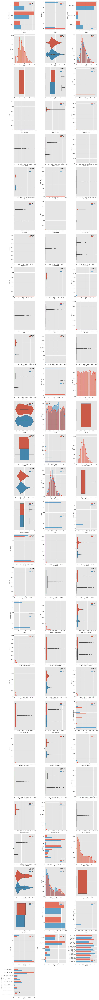

In [34]:
feature_distr(df,'Transported')

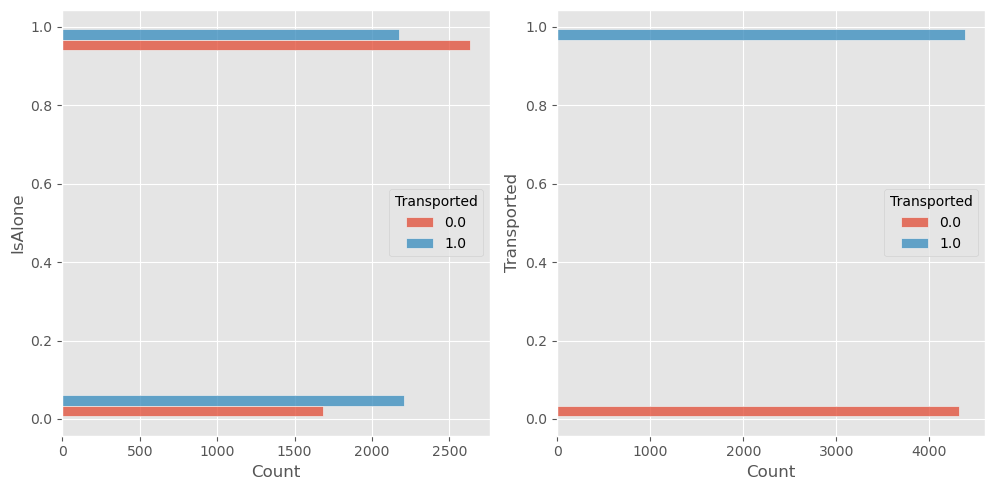

In [91]:
feature_distr(df[['IsAlone','Transported']],'Transported')

In [86]:
num_vars,cnt_vars,num_dsc,cat_dsc,bin_vars,cat_vars = checkNumCat(df_fe,printVars=True,printClasses=False)
imp_vars_rel = (cnt_vars+num_dsc+cat_dsc+bin_vars)
df_fe_rel = df.copy()

Number of numerical variables => 24 
Numerical Variables=> ['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Transported', 'Group', 'GroupSize', 'GroupMeanAge', 'IsAlone', 'FamilySize', 'HasFamily', 'Expense', 'HasExpense', 'GroupTotalExpense', 'FamilyExpense', 'NumAmenitiesUsed', 'NecessityExpense', 'LuxuryExpense', 'CabinNum', 'CabinGroupSize', 'IsMinor', 'IsChild']
Number of continuous variables => 14 
Continuous Variables=> ['Age', 'RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck', 'Group', 'GroupMeanAge', 'Expense', 'GroupTotalExpense', 'FamilyExpense', 'NecessityExpense', 'LuxuryExpense', 'CabinNum']
Number of numerical discrete variables => 4 
Numerical Discrete Variables=> ['GroupSize', 'FamilySize', 'NumAmenitiesUsed', 'CabinGroupSize']
Number of categorical discrete variables => 6 
Categorical Discrete Variables=> ['HomePlanet', 'Destination', 'CabinDeck', 'AgeBin', 'GroupBin', 'HomePlanet_Destination']
Number of binary variables => 9 
Binary Var

In [87]:
## Binary Variables 
for bin_col in bin_vars:    
    if (False in df_fe_rel[bin_col].values) | (True in df_fe_rel[bin_col].values):
        if ((0 in df_fe_rel[bin_col].values) | (1 in df_fe_rel[bin_col].values)):
            continue
        df_fe_rel[bin_col] = df_fe_rel[bin_col].map({False:0,True:1})
    else:
        uniques_in_bin = list(df_fe_rel[bin_col].unique())
        df_fe_rel[bin_col] = df_fe_rel[bin_col].map({uniques_in_bin[0]:0,uniques_in_bin[1]:1})
#Categories
df_fe_rel['HomePlanet'] = df_fe_rel['HomePlanet'].map({'Mars':1,'Europa':2,'Earth':3,'NaN':np.NaN})
df_fe_rel['Destination'] = df_fe_rel['Destination'].map({'TRAPPIST-1e':2,'55 Cancri e':1,'PSO J318.5-22':0})
df_fe_rel['CabinDeck'] = df_fe_rel['CabinDeck'].map({'T':0,'A':1,'D':2,'C':3,'B':4,'E':5,'G':6,'F':7})
df_fe_rel['AgeBin'] = df_fe_rel['AgeBin'].map({'Senior':4,'Child':0,'Teen':1,'Adult':3,'Young Adult':2})

groupLabels = ["GroupBin{}".format(i) for i in range(1,21)]
group_map_dict={}
for i,label in enumerate(groupLabels,start=1):
    group_map_dict.update({label:i})
df_fe_rel['GroupBin'] = df_fe_rel['GroupBin'].map(group_map_dict)

df_fe_rel['HomePlanet_Destination'] = df_fe_rel['HomePlanet_Destination'].map({'Europa->PSO J318.5-22':0,
                                                                               'Mars->PSO J318.5-22':1,
                                                                               'Mars->55 Cancri e':2,
                                                                               'Earth->55 Cancri e':3,
                                                                               'Earth->PSO J318.5-22':4,
                                                                               'Europa->55 Cancri e':5,
                                                                               'Europa->TRAPPIST-1e':6,
                                                                               'Mars->TRAPPIST-1e':7,
                                                                               'Earth->TRAPPIST-1e':8})

knn_imp = KNNImputer()
df_fe_rel[imp_vars_rel] = knn_imp.fit_transform(df_fe_rel[imp_vars_rel],df_fe_rel['Transported'])

In [88]:
display_corr_table(df_fe_rel,imp_vars_rel,threshold=0.30)

Age - GroupMeanAge: 0.83
Age - AgeBin: 0.92
Age - IsMinor: -0.62
Age - IsChild: -0.54
RoomService - NecessityExpense: 0.37
FoodCourt - Expense: 0.74
FoodCourt - GroupTotalExpense: 0.49
FoodCourt - FamilyExpense: 0.53
FoodCourt - NecessityExpense: 0.87
ShoppingMall - NecessityExpense: 0.34
Spa - Expense: 0.60
Spa - GroupTotalExpense: 0.40
Spa - FamilyExpense: 0.43
Spa - LuxuryExpense: 0.77
VRDeck - Expense: 0.59
VRDeck - GroupTotalExpense: 0.37
VRDeck - FamilyExpense: 0.40
VRDeck - LuxuryExpense: 0.76
Group - CabinNum: 0.68
Group - GroupBin: 1.00
GroupMeanAge - AgeBin: 0.74
GroupMeanAge - IsMinor: -0.47
GroupMeanAge - IsChild: -0.38
Expense - GroupTotalExpense: 0.63
Expense - FamilyExpense: 0.69
Expense - NecessityExpense: 0.81
Expense - LuxuryExpense: 0.78
Expense - NumAmenitiesUsed: 0.48
Expense - CabinDeck: -0.34
Expense - CryoSleep: -0.39
Expense - HasExpense: 0.44
GroupTotalExpense - FamilyExpense: 0.92
GroupTotalExpense - NecessityExpense: 0.50
GroupTotalExpense - LuxuryExpense: 0

Age - GroupMeanAge: 0.71
Age - AgeBin: 0.82
Age - IsMinor: -0.55
Age - IsChild: -0.41
RoomService - ShoppingMall: 0.38
RoomService - Expense: 0.45
RoomService - NecessityExpense: 0.55
RoomService - NumAmenitiesUsed: 0.51
RoomService - CryoSleep: -0.48
RoomService - Transported: -0.34
RoomService - HasExpense: 0.55
FoodCourt - Spa: 0.41
FoodCourt - VRDeck: 0.43
FoodCourt - Expense: 0.56
FoodCourt - GroupTotalExpense: 0.36
FoodCourt - FamilyExpense: 0.38
FoodCourt - NecessityExpense: 0.59
FoodCourt - LuxuryExpense: 0.46
FoodCourt - NumAmenitiesUsed: 0.58
FoodCourt - CryoSleep: -0.50
FoodCourt - HasExpense: 0.57
ShoppingMall - Expense: 0.42
ShoppingMall - NecessityExpense: 0.52
ShoppingMall - NumAmenitiesUsed: 0.51
ShoppingMall - CryoSleep: -0.48
ShoppingMall - HasExpense: 0.55
Spa - VRDeck: 0.38
Spa - Expense: 0.55
Spa - GroupTotalExpense: 0.33
Spa - FamilyExpense: 0.36
Spa - NecessityExpense: 0.40
Spa - LuxuryExpense: 0.73
Spa - NumAmenitiesUsed: 0.58
Spa - CryoSleep: -0.51
Spa - Transp

Age - GroupMeanAge: 0.83
Age - AgeBin: 0.93
Age - IsMinor: -0.66
Age - IsChild: -0.50
RoomService - ShoppingMall: 0.45
RoomService - Expense: 0.54
RoomService - NecessityExpense: 0.64
RoomService - NumAmenitiesUsed: 0.62
RoomService - CryoSleep: -0.53
RoomService - Transported: -0.37
RoomService - HasExpense: 0.60
FoodCourt - Spa: 0.49
FoodCourt - VRDeck: 0.51
FoodCourt - Expense: 0.67
FoodCourt - GroupTotalExpense: 0.44
FoodCourt - FamilyExpense: 0.47
FoodCourt - NecessityExpense: 0.67
FoodCourt - LuxuryExpense: 0.57
FoodCourt - NumAmenitiesUsed: 0.69
FoodCourt - CryoSleep: -0.55
FoodCourt - HasExpense: 0.62
ShoppingMall - Expense: 0.52
ShoppingMall - NecessityExpense: 0.62
ShoppingMall - NumAmenitiesUsed: 0.62
ShoppingMall - CryoSleep: -0.53
ShoppingMall - HasExpense: 0.60
Spa - VRDeck: 0.45
Spa - Expense: 0.67
Spa - GroupTotalExpense: 0.43
Spa - FamilyExpense: 0.46
Spa - NecessityExpense: 0.51
Spa - LuxuryExpense: 0.81
Spa - NumAmenitiesUsed: 0.71
Spa - CryoSleep: -0.56
Spa - Transp

In [105]:
display_corr(data=df_fe_rel[imp_vars_rel],vars=imp_vars_rel,fig_name='Last_Relations_Map.png')

In [90]:
mutualInfoCLF(data=df_fe_rel[imp_vars_rel],vars=imp_vars_rel,target_var='Transported',n_runs=20)

Transported               0.694628
Expense                   0.133587
NecessityExpense          0.127155
HasExpense                0.123374
NumAmenitiesUsed          0.121107
LuxuryExpense             0.116884
CryoSleep                 0.115119
FamilyExpense             0.081742
GroupTotalExpense         0.077531
Spa                       0.077523
RoomService               0.074488
VRDeck                    0.067401
ShoppingMall              0.050797
FoodCourt                 0.047235
CabinDeck                 0.024843
HomePlanet_Destination    0.022884
Group                     0.021866
HomePlanet                0.019084
CabinNum                  0.014114
Age                       0.011889
CabinGroupSize            0.011096
GroupMeanAge              0.010150
Destination               0.009369
GroupSize                 0.009311
IsChild                   0.008211
AgeBin                    0.008033
IsMinor                   0.007724
IsAlone                   0.006665
CabinSide           

<mark>Drops

HomePlanet_Destination CabinNum CabinGroupSize GroupMeanAge Age AgeBin IsAlone GroupSize CabinSide Destination IsMinor FamilySize GroupBin VIP GroupTotalExpense FamilyExpense  will be dropped

# 
